# Python Capstone - Battle Of Neighborhoods - Gyms in Amsterdam

## 1.0 Introduction 

##### In the recent years the fitness industry has been booming in the Netherlands. New sports locations, apps, blogs, instagram influencers related to fitness and well-being keep appearing at a fast pace and many gym chains are growing and expanding with a high rate. According to CBS, in 2017, 2.25 million  people in the Netherlands had a gym membership.  Moreover, on avg a fitness centers have over 1100 members. 


##### In the Netherlands Gym and fitness industry is mostly controlled by gym-chains, with Basic-Fit being the biggest with 152 locations (2018), and SportsCity/FitForFree galling second with 107 locations (Statista, 2018)
 

##### With a high trending industry competition is also fierce. Moreover, property cost in Amsterdam are scoring at all time high. Hence, opening up a new location comes with high fixed cost and a big risk. Therefore, before opening up a new location, a gym chain will have to carry out  extensive analysis on the best neighborhood to open up a new facility. This project will provide one way to analysize different neighborhoods based on the number of gyms, their ratings and population sizes. The analysis can support decision making on which neighborhoods have a high potential for a new gym location. Moreover, we can identify neighborhoods that are already saturated and don't have a good potential for expansion. 


## 2.0 Data 

##### To succesfully build this project and understand the best neighborhoods to open up a gym in Amsterdam we will be using the following data sources: 

##### - Amsterdam Neighborhood Data 
- Data Source: https://claircitydata.cbs.nl/dataset/districts-and-neighbourhoods-amsterdam/resource/d02c5f12-1cfa-4d7c-91d3-41af8e4ed634?view_id=5bae9d1c-2bfc-4f00-b15a-69a27632c41c 
####### - Description: This dataset describes the different neighborhoods in Amsterdam with their respective latitudes and longitues. It also contains useful information about the population of different age groups in each neighborhood. This dataset also contains the GEOJSON features that will be used to visualize the data on a choloropeth map. 

###### - Gyms/Fitness Centers in Amsterdam Neighborhoods 
- Data Source: FourSquare API 
- Description: FourSquare API can provide us venue information that we can retrieve based on the Amsterdam Neighborhood latitudes and longitudes. We will further limit this data to include only information about sports venues (gyms) in Amsterdam Area. We will retrieve information such as: Venue Name, Category, Location, Rating, Likes etc. 


## 3.0 Analysis 

##### - This section will be provide the data preparation, explorative as well as descriptive data analysis for the project 

##### - Type of Questions that we will explore 
- What are potential locations for a new gym? 
- Which districts have the most gyms? 
- Which districts have least gyms per resident?
- Which district have highest rating? 
- Which districts are already saturated?

###### - First we start with importing required libraries for our analysis

In [1]:
import pandas as pd 
import requests 
import folium   # map visualizations
import json   #geojson 

%matplotlib inline 

import matplotlib as mpl 
import matplotlib.pyplot as plt  

import matplotlib.cm as cm 
import matplotlib.colors as colors

import random # library for random number generation
import numpy as np # library for vectorized computation 

from sklearn.cluster import KMeans  #for k-means clustering of the districts
from sklearn.datasets.samples_generator import make_blobs

print('Libraries imported.')

Libraries imported.


###### - Let's start by uploading data from the Amsterdam City Districts. This data is from: https://claircitydata.cbs.nl/dataset/districts-and-neighbourhoods-amsterdam/resource/d02c5f12-1cfa-4d7c-91d3-41af8e4ed634?view_id=5bae9d1c-2bfc-4f00-b15a-69a27632c41c  and saved to a local storage

In [2]:
#import Amsterdam City District Data
df_ams = pd.read_csv(r'C:\Users\tiina\Downloads\wijken_buurten.csv')   

#filter data to contains only  region type "Wijk" == City Disctricts
df_ams = df_ams[(df_ams.regio_type =="Wijk")]  
#keep only required columns  
df_ams = df_ams[['subject', 'lat', 'lon', 'nage_15_to_25','nage_25_to_45']]  

#rename column names and sum up the populations from the two age groups 
df_ams['Gym Population'] = df_ams['nage_15_to_25'] + df_ams['nage_25_to_45']  
df_ams.drop(['nage_15_to_25','nage_25_to_45'],axis=1, inplace=True)
df_ams.rename(columns={'subject':'District', 'lat':'Latitude', 'lon':'Longitude'}, inplace=True) 
df_ams.reset_index()
df_ams.head(10)


,District,Latitude,Longitude,Gym Population
1,Burgwallen-Oude Zijde,52.372566,4.896943,2705
7,Burgwallen-Nieuwe Zijde,52.375703,4.895518,2695
16,Grachtengordel-West,52.373709,4.886836,3055
21,Grachtengordel-Zuid,52.364821,4.893349,2775
29,Nieuwmarkt/Lastage,52.372436,4.905641,4400
39,Haarlemmerbuurt,52.384171,4.890582,3975
46,Jordaan,52.374805,4.880786,9065
58,De Weteringschans,52.361170,4.892427,3965
67,Weesperbuurt/Plantage,52.364499,4.911103,4020
72,Oostelijke Eilanden/Kadijken,52.370861,4.921954,5580


In [3]:
#print info 
print(df_ams.info()) 
print(df_ams.District.unique())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99 entries, 1 to 576
Data columns (total 4 columns):
District          99 non-null object
Latitude          99 non-null float64
Longitude         99 non-null float64
Gym Population    99 non-null int64
dtypes: float64(2), int64(1), object(1)
memory usage: 3.9+ KB
None
['Burgwallen-Oude Zijde' 'Burgwallen-Nieuwe Zijde' 'Grachtengordel-West'
 'Grachtengordel-Zuid' 'Nieuwmarkt/Lastage' 'Haarlemmerbuurt' 'Jordaan'
 'De Weteringschans' 'Weesperbuurt/Plantage'
 'Oostelijke Eilanden/Kadijken' 'Westelijk Havengebied'
 'Bedrijventerrein Sloterdijk' 'Houthavens'
 'Spaarndammer- en Zeeheldenbuurt' 'Staatsliedenbuurt' 'Centrale Markt'
 'Frederik Hendrikbuurt' 'Da Costabuurt' 'Kinkerbuurt' 'Van Lennepbuurt'
 'Helmersbuurt' 'Overtoomse Sluis' 'Vondelbuurt' 'Zuidas' 'Oude Pijp'
 'Nieuwe Pijp' 'Zuid Pijp' 'Weesperzijde' 'Oosterparkbuurt' 'Dapperbuurt'
 'Transvaalbuurt' 'Indische Buurt West' 'Indische Buurt Oost'
 'Oostelijk Havengebied' 'Zeeburgereilan

###### - Let's request the venue data from Foursquare API

In [4]:
#four square credentials 
CLIENT_ID = 'ITO21IIG1RK22RYIV1SW4EVXA0B1UEO3N2JDPF3SHB3F2U1N' # your Foursquare ID
CLIENT_SECRET = 'KS0MF45WTLBU0422INT44UIEEBUROZZ342UWDCCQ55RLVCDO' # your Foursquare Secret

VERSION = '20190106' # Foursquare API version 
LIMIT = 800

print('This cell defined the Foursquare credentials')

This cell defined the Foursquare credentials


In [5]:
#define the get venus function 
def getNearbyVenues(names, latitudes, longitudes, populations, radius=1000):
    
    venues_list=[]
    for name, lat, lng, pop in zip( names, latitudes, longitudes, populations):
        
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        # return only relevant information for each nearby venue
        venues_list.append([( 
            name, 
            lat, 
            lng, 
            pop, 
            v['venue']['id'],
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],   
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = [ 
                  'District', 
                  'Latitude', 
                  'Longitude',  
                  'Gym Population', 
                'venue_id' , 
        'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude',  
                'Venue Category']
    
    return(nearby_venues) 


In [6]:
#Creating a dataframe for the venues in Amsterdam by District 

amsterdam_venues = getNearbyVenues(names=df_ams['District'],

                                   latitudes=df_ams['Latitude'],

                                   longitudes=df_ams['Longitude'], 
                                   
                                   populations=df_ams['Gym Population']

                                )


In [7]:
#examine the formed dataset 
print(amsterdam_venues.head())

#see how many vanues were for each Borough 
print(amsterdam_venues.groupby('District').count()) 

#unique categories 
print('There are {} uniques categories.'.format(len(amsterdam_venues['Venue Category'].unique())))

                District   Latitude  Longitude  Gym Population  \
0  Burgwallen-Oude Zijde  52.372566   4.896943            2705   
1  Burgwallen-Oude Zijde  52.372566   4.896943            2705   
2  Burgwallen-Oude Zijde  52.372566   4.896943            2705   
3  Burgwallen-Oude Zijde  52.372566   4.896943            2705   
4  Burgwallen-Oude Zijde  52.372566   4.896943            2705   

                   venue_id                               Venue  \
0  51d98583498e78da6626be60                 De Koffieschenkerij   
1  589e54ab2c55ec7cf2e2f707                 Rosalia's Menagerie   
2  4a270666f964a520d88a1fe3  Sofitel Legend The Grand Amsterdam   
3  4a270317f964a52075841fe3                      Wynand Fockink   
4  4b9ff646f964a520f44d37e3                                 Dam   

   Venue Latitude  Venue Longitude Venue Category  
0       52.374043         4.898427    Coffee Shop  
1       52.371678         4.899174   Cocktail Bar  
2       52.371093         4.895410          

In [8]:
# find the category values 
amsterdam_venues['Venue Category'].unique() 


array(['Coffee Shop', 'Cocktail Bar', 'Hotel', 'Liquor Store', 'Plaza',
       'Dessert Shop', 'Bookstore', 'Salon / Barbershop', 'Bakery',
       'Restaurant', 'Department Store', 'Arcade', 'Snack Place',
       'Argentinian Restaurant', 'Music Venue', 'Café',
       'Marijuana Dispensary', 'Cheese Shop', 'Bar', 'Art Gallery',
       'Church', 'Burger Joint', 'Seafood Restaurant', 'Chocolate Shop',
       'Swiss Restaurant', 'Museum', 'Clothing Store', 'Record Shop',
       'Ice Cream Shop', 'Thai Restaurant', 'Science Museum',
       'Mediterranean Restaurant', 'Chinese Restaurant', 'Tea Room',
       'Italian Restaurant', 'Dive Bar', 'French Restaurant', 'Brewery',
       'Tattoo Parlor', 'Breakfast Spot', 'Gay Bar', 'Smoke Shop',
       'Sandwich Place', 'Beer Bar', 'Design Studio', 'Beer Store',
       'Cosmetics Shop', 'History Museum', 'Pub', 'Whisky Bar',
       'Arts & Crafts Store', 'Candy Store', 'Indian Restaurant',
       'Paper / Office Supplies Store', 'Creperie', 'Gift 

In [9]:
#filter the data to contain only gyms / sports halls 
sports = ['Gym / Fitness Center', 'Gym','Sports Club', 'Athletics & Sports', 'Climing Gym', 'Gymnastics Gym'] 
ams_gyms = amsterdam_venues[amsterdam_venues['Venue Category'].isin(sports)] 
ams_gyms.head()  

#define dataframe with venue ids to be used as a key to get venue details
ams_gymids = ams_gyms['venue_id'] 

In [10]:
#define function to get venue details 

def get_venue_details(venue_id): 
    
    #four square credentials 
    CLIENT_ID = 'ITO21IIG1RK22RYIV1SW4EVXA0B1UEO3N2JDPF3SHB3F2U1N' # your Foursquare ID
    CLIENT_SECRET = 'KS0MF45WTLBU0422INT44UIEEBUROZZ342UWDCCQ55RLVCDO' # your Foursquare Secret

    VERSION = '20190106' # Foursquare API version 
    LIMIT = 1000
    
    
    #url to fetch data from foursquare api
    url = 'https://api.foursquare.com/v2/venues/{}?&client_id={}&client_secret={}&v={}'.format(
            venue_id,
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION)
    
    # get all the data
    results = requests.get(url).json() 
    print(results)
    venue_data=results['response']['venue']
    venue_details=[]
    try:
        venue_id=venue_data['id']
        venue_likes=venue_data['likes']['count']
        venue_rating=venue_data['rating']
        venue_tips=venue_data['tips']['count']
        venue_details.append([venue_id,venue_likes,venue_rating,venue_tips])
    except KeyError:
        pass
        
    column_names=['ID','Likes','Rating','Tips']
    venue_details = pd.DataFrame(venue_details,columns=column_names)
    return venue_details


In [11]:
# prepare districts list that contains gym details
column_names=['ID','Likes','Rating','Tips']
ams_gyms_stats=pd.DataFrame(columns=column_names)
count=1


for row in ams_gymids.values.tolist():
    venue_id=row
    try:
        venue_details=get_venue_details(venue_id)
        print(venue_details)
        id, likes,rating,tips=venue_details.values.tolist()[0]
    except (IndexError, KeyError) as e:
        print('No data available for id=',venue_id)
        # we will assign 0 value for these resturants as they may have been 
        #recently opened or details does not exist in FourSquare Database
        id, likes,rating,tips=[0]*4
    print('(',count,'/', len(ams_gyms),')','processed')
    ams_gyms_stats = ams_gyms_stats.append({
                                                'ID': id,
                                                'Likes' : likes,
                                                'Rating' : rating,
                                                'Tips' : tips
                                               }, ignore_index=True)
    count+=1
        

{'meta': {'code': 200, 'requestId': '5e1648d20be7b4001bc3db01'}, 'response': {'venue': {'id': '4b155b3cf964a5207cab23e3', 'name': 'Health Club Jordaan', 'contact': {'phone': '+31204897676', 'formattedPhone': '+31 20 489 7676'}, 'location': {'address': 'Eerste Rozendwarsstraat 10', 'lat': 52.37296939410233, 'lng': 4.880215040534359, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37296939410233, 'lng': 4.880215040534359}], 'postalCode': '1016 PC', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Eerste Rozendwarsstraat 10', '1016 PC Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/health-club-jordaan/4b155b3cf964a5207cab23e3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'sta

{'meta': {'code': 200, 'requestId': '5e1648b91e152c001b2bcb0c'}, 'response': {'venue': {'id': '4a6f294cf964a5207bd51fe3', 'name': 'Sportcity', 'contact': {'phone': '+31206273060', 'formattedPhone': '+31 20 627 3060', 'twitter': 'clubsportive'}, 'location': {'address': '1e Weteringdwarsstraat 3-7', 'lat': 52.3620619468173, 'lng': 4.887875033568583, 'labeledLatLngs': [{'label': 'display', 'lat': 52.3620619468173, 'lng': 4.887875033568583}], 'postalCode': '1017 TL', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['1e Weteringdwarsstraat 3-7', '1017 TL Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sportcity/4a6f294cf964a5207bd51fe3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': True,

{'meta': {'code': 200, 'requestId': '5e164911df2774001c51cec5'}, 'response': {'venue': {'id': '4a6da31ff964a520d1d21fe3', 'name': 'Squash City', 'contact': {'phone': '+31206267883', 'formattedPhone': '+31 20 626 7883'}, 'location': {'address': 'Ketelmakerstraat 6', 'lat': 52.38313469531581, 'lng': 4.890564956293654, 'labeledLatLngs': [{'label': 'display', 'lat': 52.38313469531581, 'lng': 4.890564956293654}], 'postalCode': '1013 DE', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Ketelmakerstraat 6', '1013 DE Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/squash-city/4a6da31ff964a520d1d21fe3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics &

{'meta': {'code': 200, 'requestId': '5e16486795feaf001b51c778'}, 'response': {'venue': {'id': '4b155b3cf964a5207cab23e3', 'name': 'Health Club Jordaan', 'contact': {'phone': '+31204897676', 'formattedPhone': '+31 20 489 7676'}, 'location': {'address': 'Eerste Rozendwarsstraat 10', 'lat': 52.37296939410233, 'lng': 4.880215040534359, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37296939410233, 'lng': 4.880215040534359}], 'postalCode': '1016 PC', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Eerste Rozendwarsstraat 10', '1016 PC Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/health-club-jordaan/4b155b3cf964a5207cab23e3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'sta

{'meta': {'code': 200, 'requestId': '5e1648b198205d001be174e7'}, 'response': {'venue': {'id': '4a6f294cf964a5207bd51fe3', 'name': 'Sportcity', 'contact': {'phone': '+31206273060', 'formattedPhone': '+31 20 627 3060', 'twitter': 'clubsportive'}, 'location': {'address': '1e Weteringdwarsstraat 3-7', 'lat': 52.3620619468173, 'lng': 4.887875033568583, 'labeledLatLngs': [{'label': 'display', 'lat': 52.3620619468173, 'lng': 4.887875033568583}], 'postalCode': '1017 TL', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['1e Weteringdwarsstraat 3-7', '1017 TL Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sportcity/4a6f294cf964a5207bd51fe3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': True,

{'meta': {'code': 200, 'requestId': '5e1648c4edbcad001b0817fe'}, 'response': {'venue': {'id': '5b0987ca628c83002c42b7fc', 'name': 'Hyatt Regency Fitness Center and Spa', 'contact': {}, 'location': {'lat': 52.36171, 'lng': 4.911621, 'labeledLatLngs': [{'label': 'display', 'lat': 52.36171, 'lng': 4.911621}], 'postalCode': '1018 GV', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['1018 GV Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/hyatt-regency-fitness-center-and-spa/5b0987ca628c83002c42b7fc', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d1ed941735', 'name': 'Spa', 'pluralName': 'Spas', 'shortName': 'Spa', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops

{'meta': {'code': 200, 'requestId': '5e16484fbae9a2002693e090'}, 'response': {'venue': {'id': '57c9c816498e17c454f16d7b', 'name': 'New York Gym', 'contact': {}, 'location': {'lat': 52.375630277764365, 'lng': 4.928309865063385, 'labeledLatLngs': [{'label': 'display', 'lat': 52.375630277764365, 'lng': 4.928309865063385}], 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/new-york-gym/57c9c816498e17c454f16d7b', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 3}, 'likes': {'count': 22, 'groups': [{'type': 'others', 'count': 22, 'items': []}], 'summary': '22 Likes'}, 'dislike': False, 'ok': False, 'rating': 7.9, 'ratingColor': 'C5DE35', 'ratingSignals': 29, 'allowMenuUrlEdit': True, 'beenHere': {'count': 0, 'unconfirme

{'meta': {'code': 200, 'requestId': '5e1648be83525f001bbd36c5'}, 'response': {'venue': {'id': '4f818020e4b0a458baff5f1f', 'name': 'Shape-all-in', 'contact': {'phone': '+31204866007', 'formattedPhone': '+31 20 486 6007', 'twitter': 'shapeallin', 'facebook': '380328671996550', 'facebookUsername': 'shapeallin', 'facebookName': 'Shape all in'}, 'location': {'address': 'Van Hallstraat 617', 'crossStreet': 'Donker Curtiusstraat', 'lat': 52.379399038880955, 'lng': 4.871916528244206, 'labeledLatLngs': [{'label': 'display', 'lat': 52.379399038880955, 'lng': 4.871916528244206}], 'postalCode': '1051 HE', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Van Hallstraat 617 (Donker Curtiusstraat)', '1051 HE Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/shapeallin/4f818020e4b0a458baff5f1f', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName'

{'meta': {'code': 200, 'requestId': '5e1648c6c546f3001b9abc99'}, 'response': {'venue': {'id': '4f818020e4b0a458baff5f1f', 'name': 'Shape-all-in', 'contact': {'phone': '+31204866007', 'formattedPhone': '+31 20 486 6007', 'twitter': 'shapeallin', 'facebook': '380328671996550', 'facebookUsername': 'shapeallin', 'facebookName': 'Shape all in'}, 'location': {'address': 'Van Hallstraat 617', 'crossStreet': 'Donker Curtiusstraat', 'lat': 52.379399038880955, 'lng': 4.871916528244206, 'labeledLatLngs': [{'label': 'display', 'lat': 52.379399038880955, 'lng': 4.871916528244206}], 'postalCode': '1051 HE', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Van Hallstraat 617 (Donker Curtiusstraat)', '1051 HE Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/shapeallin/4f818020e4b0a458baff5f1f', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName'

{'meta': {'code': 200, 'requestId': '5e16487fb4b684001bd60e14'}, 'response': {'venue': {'id': '4b9bd396f964a5200c2a36e3', 'name': 'Sento Spa & Health', 'contact': {'phone': '+31203301444', 'formattedPhone': '+31 20 330 1444'}, 'location': {'address': 'Marnixplein 1', 'lat': 52.37803731232872, 'lng': 4.878693066226278, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37803731232872, 'lng': 4.878693066226278}], 'postalCode': '1015ZN', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Marnixplein 1', '1015ZN Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sento-spa--health/4b9bd396f964a5200c2a36e3', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d102941735', 'name': 'Yoga Studio', 'pluralName': 'Yoga Studios', 'shortName':

{'meta': {'code': 200, 'requestId': '5e1648be6d8c56001bac1636'}, 'response': {'venue': {'id': '4f818020e4b0a458baff5f1f', 'name': 'Shape-all-in', 'contact': {'phone': '+31204866007', 'formattedPhone': '+31 20 486 6007', 'twitter': 'shapeallin', 'facebook': '380328671996550', 'facebookUsername': 'shapeallin', 'facebookName': 'Shape all in'}, 'location': {'address': 'Van Hallstraat 617', 'crossStreet': 'Donker Curtiusstraat', 'lat': 52.379399038880955, 'lng': 4.871916528244206, 'labeledLatLngs': [{'label': 'display', 'lat': 52.379399038880955, 'lng': 4.871916528244206}], 'postalCode': '1051 HE', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Van Hallstraat 617 (Donker Curtiusstraat)', '1051 HE Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/shapeallin/4f818020e4b0a458baff5f1f', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName'

{'meta': {'code': 200, 'requestId': '5e164880b4b684001bd6123d'}, 'response': {'venue': {'id': '4b155b3cf964a5207cab23e3', 'name': 'Health Club Jordaan', 'contact': {'phone': '+31204897676', 'formattedPhone': '+31 20 489 7676'}, 'location': {'address': 'Eerste Rozendwarsstraat 10', 'lat': 52.37296939410233, 'lng': 4.880215040534359, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37296939410233, 'lng': 4.880215040534359}], 'postalCode': '1016 PC', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Eerste Rozendwarsstraat 10', '1016 PC Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/health-club-jordaan/4b155b3cf964a5207cab23e3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'sta

{'meta': {'code': 200, 'requestId': '5e164888a2e538001b3237a2'}, 'response': {'venue': {'id': '4b155b3cf964a5207cab23e3', 'name': 'Health Club Jordaan', 'contact': {'phone': '+31204897676', 'formattedPhone': '+31 20 489 7676'}, 'location': {'address': 'Eerste Rozendwarsstraat 10', 'lat': 52.37296939410233, 'lng': 4.880215040534359, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37296939410233, 'lng': 4.880215040534359}], 'postalCode': '1016 PC', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Eerste Rozendwarsstraat 10', '1016 PC Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/health-club-jordaan/4b155b3cf964a5207cab23e3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'sta

{'meta': {'code': 200, 'requestId': '5e1648cec94979001b0dcfd6'}, 'response': {'venue': {'id': '5a8dccb6364d97403b054dfd', 'name': 'Saints & Stars', 'contact': {}, 'location': {'lat': 52.36379674190164, 'lng': 4.872997321176407, 'labeledLatLngs': [{'label': 'display', 'lat': 52.36379674190164, 'lng': 4.872997321176407}], 'postalCode': '1054 AG', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['1054 AG Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/saints--stars/5a8dccb6364d97403b054dfd', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 15, 'groups': [{'type': 'others', 'count': 15, 'items': []}], 'summary': '15 Likes'}, 'dislike': Fal

{'meta': {'code': 200, 'requestId': '5e164889a2e538001b323baf'}, 'response': {'venue': {'id': '5a8dccb6364d97403b054dfd', 'name': 'Saints & Stars', 'contact': {}, 'location': {'lat': 52.36379674190164, 'lng': 4.872997321176407, 'labeledLatLngs': [{'label': 'display', 'lat': 52.36379674190164, 'lng': 4.872997321176407}], 'postalCode': '1054 AG', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['1054 AG Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/saints--stars/5a8dccb6364d97403b054dfd', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 15, 'groups': [{'type': 'others', 'count': 15, 'items': []}], 'summary': '15 Likes'}, 'dislike': Fal

{'meta': {'code': 200, 'requestId': '5e1648bcd03993001b180a16'}, 'response': {'venue': {'id': '54a69046498ec3e41414a19a', 'name': 'VondelGym', 'contact': {'twitter': 'vondelgym'}, 'location': {'address': 'Overtoom 143', 'lat': 52.36192208987616, 'lng': 4.87294377902747, 'labeledLatLngs': [{'label': 'display', 'lat': 52.36192208987616, 'lng': 4.87294377902747}], 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Overtoom 143', 'Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/vondelgym/54a69046498ec3e41414a19a', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'url': 'http://vondelgym.nl', 'likes': {'count': 22, 'groups': [{'type': 'others', 'count': 22, 'i

{'meta': {'code': 200, 'requestId': '5e1648d1542890001bb3e151'}, 'response': {'venue': {'id': '5a8dccb6364d97403b054dfd', 'name': 'Saints & Stars', 'contact': {}, 'location': {'lat': 52.36379674190164, 'lng': 4.872997321176407, 'labeledLatLngs': [{'label': 'display', 'lat': 52.36379674190164, 'lng': 4.872997321176407}], 'postalCode': '1054 AG', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['1054 AG Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/saints--stars/5a8dccb6364d97403b054dfd', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 15, 'groups': [{'type': 'others', 'count': 15, 'items': []}], 'summary': '15 Likes'}, 'dislike': Fal

{'meta': {'code': 200, 'requestId': '5e1648cac546f3001b9acf5b'}, 'response': {'venue': {'id': '4a73ef5cf964a5209ddd1fe3', 'name': 'David Lloyd Amsterdam', 'contact': {'phone': '+31880202103', 'formattedPhone': '+31 88 020 2103', 'facebook': '1589431604604974', 'facebookUsername': 'DavidLloydAmsterdam', 'facebookName': 'David Lloyd Leisure Nederland'}, 'location': {'address': 'Overtoom 557', 'lat': 52.357457, 'lng': 4.856097, 'labeledLatLngs': [{'label': 'display', 'lat': 52.357457, 'lng': 4.856097}], 'postalCode': '1054LK', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Overtoom 557', '1054LK Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/david-lloyd-amsterdam/4a73ef5cf964a5209ddd1fe3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym

{'meta': {'code': 200, 'requestId': '5e1648ef77af03001b75e613'}, 'response': {'venue': {'id': '55cf19f9498e5e99b411349b', 'name': 'Basic-Fit', 'contact': {}, 'location': {'address': 'Baarsjesweg 224', 'lat': 52.363284933192794, 'lng': 4.858367098033827, 'labeledLatLngs': [{'label': 'display', 'lat': 52.363284933192794, 'lng': 4.858367098033827}], 'postalCode': '1058AA', 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Baarsjesweg 224', '1058AA', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/basicfit/55cf19f9498e5e99b411349b', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/ca

{'meta': {'code': 200, 'requestId': '5e1648d3216785001bf644ba'}, 'response': {'venue': {'id': '5a8dccb6364d97403b054dfd', 'name': 'Saints & Stars', 'contact': {}, 'location': {'lat': 52.36379674190164, 'lng': 4.872997321176407, 'labeledLatLngs': [{'label': 'display', 'lat': 52.36379674190164, 'lng': 4.872997321176407}], 'postalCode': '1054 AG', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['1054 AG Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/saints--stars/5a8dccb6364d97403b054dfd', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 15, 'groups': [{'type': 'others', 'count': 15, 'items': []}], 'summary': '15 Likes'}, 'dislike': Fal

{'meta': {'code': 200, 'requestId': '5e16487c0f596800221f65e6'}, 'response': {'venue': {'id': '54a69046498ec3e41414a19a', 'name': 'VondelGym', 'contact': {'twitter': 'vondelgym'}, 'location': {'address': 'Overtoom 143', 'lat': 52.36192208987616, 'lng': 4.87294377902747, 'labeledLatLngs': [{'label': 'display', 'lat': 52.36192208987616, 'lng': 4.87294377902747}], 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Overtoom 143', 'Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/vondelgym/54a69046498ec3e41414a19a', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'url': 'http://vondelgym.nl', 'likes': {'count': 22, 'groups': [{'type': 'others', 'count': 22, 'i

{'meta': {'code': 200, 'requestId': '5e16487a1835dd001b6b3c53'}, 'response': {'venue': {'id': '5a8dccb6364d97403b054dfd', 'name': 'Saints & Stars', 'contact': {}, 'location': {'lat': 52.36379674190164, 'lng': 4.872997321176407, 'labeledLatLngs': [{'label': 'display', 'lat': 52.36379674190164, 'lng': 4.872997321176407}], 'postalCode': '1054 AG', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['1054 AG Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/saints--stars/5a8dccb6364d97403b054dfd', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 15, 'groups': [{'type': 'others', 'count': 15, 'items': []}], 'summary': '15 Likes'}, 'dislike': Fal

{'meta': {'code': 200, 'requestId': '5e1648c37828ae001bcb650b'}, 'response': {'venue': {'id': '4c3cc5e0b36ac92815920486', 'name': 'Clubsportive', 'contact': {'phone': '+31206617808', 'formattedPhone': '+31 20 661 7808'}, 'location': {'address': 'Gustav Mahlerlaan 16', 'lat': 52.336733, 'lng': 4.872198, 'labeledLatLngs': [{'label': 'display', 'lat': 52.336733, 'lng': 4.872198}], 'postalCode': '1082 LS', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Gustav Mahlerlaan 16', '1082 LS Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/clubsportive/4c3cc5e0b36ac92815920486', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / F

{'meta': {'code': 200, 'requestId': '5e1648ccedbcad001b083e99'}, 'response': {'venue': {'id': '5840728dde0cbc60a8a6dbae', 'name': 'Gustav Gym', 'contact': {}, 'location': {'address': 'George Gershwinlaan 520', 'lat': 52.33631386155812, 'lng': 4.869881264520547, 'labeledLatLngs': [{'label': 'display', 'lat': 52.33631386155812, 'lng': 4.869881264520547}], 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['George Gershwinlaan 520', 'Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/gustav-gym/5840728dde0cbc60a8a6dbae', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 8, 'groups': [{'type': 'others', 'count': 8, 'items': [{'id': '0', 'firstNa

{'meta': {'code': 200, 'requestId': '5e16485340a7ea001c319a4d'}, 'response': {'venue': {'id': '4a26ffa9f964a52088801fe3', 'name': 'Café USC', 'contact': {}, 'location': {'address': 'De Boelelaan 46', 'lat': 52.33532130718231, 'lng': 4.880461692810059, 'labeledLatLngs': [{'label': 'display', 'lat': 52.33532130718231, 'lng': 4.880461692810059}], 'postalCode': '1082 LR', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['De Boelelaan 46', '1082 LR Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/caf%C3%A9-usc/4a26ffa9f964a52088801fe3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss

{'meta': {'code': 200, 'requestId': '5e1648e9f7706a001cbb08cc'}, 'response': {'venue': {'id': '4b407749f964a52062b825e3', 'name': 'Fresh Fitness', 'contact': {'phone': '+31206751207', 'formattedPhone': '+31 20 675 1207'}, 'location': {'address': 'Tolstraat 57-59', 'crossStreet': 'Toldwarsstraat', 'lat': 52.35198516710241, 'lng': 4.901386228325552, 'labeledLatLngs': [{'label': 'display', 'lat': 52.35198516710241, 'lng': 4.901386228325552}], 'postalCode': '1073 RW', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Tolstraat 57-59 (Toldwarsstraat)', '1073 RW Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/fresh-fitness/4b407749f964a52062b825e3', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 8}, 'likes'

{'meta': {'code': 200, 'requestId': '5e16491d5fb726001bfaeec2'}, 'response': {'venue': {'id': '4a5615def964a52066b41fe3', 'name': 'Sportcity', 'contact': {'phone': '+31204655666', 'formattedPhone': '+31 20 465 5666'}, 'location': {'address': 'Wibautstraat 224', 'lat': 52.349012503807906, 'lng': 4.916925592194181, 'labeledLatLngs': [{'label': 'display', 'lat': 52.349012503807906, 'lng': 4.916925592194181}], 'postalCode': '1097 DN', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Wibautstraat 224', '1097 DN Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sportcity/4a5615def964a52066b41fe3', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4d1cf8421a97d635ce361c31', 'name': 'Tanning Salon', 'pluralName': 'Tanning Salons', 'shortName': 'T

{'meta': {'code': 200, 'requestId': '5e16481f660a9f0025154730'}, 'response': {'venue': {'id': '4b2fcc7ef964a5201ff024e3', 'name': 'Sports World', 'contact': {'phone': '+31206630903', 'formattedPhone': '+31 20 663 0903'}, 'location': {'address': 'Oranjevrijstaatkade 21', 'lat': 52.35622314724411, 'lng': 4.929161353390213, 'labeledLatLngs': [{'label': 'display', 'lat': 52.35622314724411, 'lng': 4.929161353390213}], 'postalCode': '1093 KS', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Oranjevrijstaatkade 21', '1093 KS Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sports-world/4b2fcc7ef964a5201ff024e3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 17},

{'meta': {'code': 200, 'requestId': '5e164815aba297001c398311'}, 'response': {'venue': {'id': '5824a0e6cb54577f8df81bbb', 'name': 'VondelGym East', 'contact': {}, 'location': {'lat': 52.354106515703045, 'lng': 4.9129620342544555, 'labeledLatLngs': [{'label': 'display', 'lat': 52.354106515703045, 'lng': 4.9129620342544555}], 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/vondelgym-east/5824a0e6cb54577f8df81bbb', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'likes': {'count': 16, 'groups': [{'type': 'others', 'count': 16, 'items': []}], 'summary': '16 Likes'}, 'dislike': False, 'ok': False, 'rating': 7.9, 'ratingColor': 'C5DE35', 'ratingSignals': 19, 'allowMenu

{'meta': {'code': 200, 'requestId': '5e1648eb618f43001b198f57'}, 'response': {'venue': {'id': '4dd8c87efa76ad96d14699cc', 'name': 'Akademia Training Club', 'contact': {'phone': '+31202215797', 'formattedPhone': '+31 20 221 5797'}, 'location': {'address': 'Javaplein 14', 'lat': 52.36404518280632, 'lng': 4.9390345032356935, 'labeledLatLngs': [{'label': 'display', 'lat': 52.36404518280632, 'lng': 4.9390345032356935}], 'postalCode': '1094 HW', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Javaplein 14', '1094 HW Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/akademia-training-club/4dd8c87efa76ad96d14699cc', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 7

{'meta': {'code': 200, 'requestId': '5e1648ca60ba08001b8ec190'}, 'response': {'venue': {'id': '5824a0e6cb54577f8df81bbb', 'name': 'VondelGym East', 'contact': {}, 'location': {'lat': 52.354106515703045, 'lng': 4.9129620342544555, 'labeledLatLngs': [{'label': 'display', 'lat': 52.354106515703045, 'lng': 4.9129620342544555}], 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/vondelgym-east/5824a0e6cb54577f8df81bbb', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'likes': {'count': 16, 'groups': [{'type': 'others', 'count': 16, 'items': []}], 'summary': '16 Likes'}, 'dislike': False, 'ok': False, 'rating': 7.9, 'ratingColor': 'C5DE35', 'ratingSignals': 19, 'allowMenu

{'meta': {'code': 200, 'requestId': '5e1648e5be61c9001b13d40a'}, 'response': {'venue': {'id': '4dd8c87efa76ad96d14699cc', 'name': 'Akademia Training Club', 'contact': {'phone': '+31202215797', 'formattedPhone': '+31 20 221 5797'}, 'location': {'address': 'Javaplein 14', 'lat': 52.36404518280632, 'lng': 4.9390345032356935, 'labeledLatLngs': [{'label': 'display', 'lat': 52.36404518280632, 'lng': 4.9390345032356935}], 'postalCode': '1094 HW', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Javaplein 14', '1094 HW Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/akademia-training-club/4dd8c87efa76ad96d14699cc', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 7

{'meta': {'code': 200, 'requestId': '5e1648d1edbcad001b08562a'}, 'response': {'venue': {'id': '55a66681498ea7e1d87acdbb', 'name': 'Kensho Premium Fitness', 'contact': {'phone': '+31202217770', 'formattedPhone': '+31 20 221 7770'}, 'location': {'address': 'Czaar Peterstraat 20', 'lat': 52.36890771530127, 'lng': 4.9276321103511975, 'labeledLatLngs': [{'label': 'display', 'lat': 52.36890771530127, 'lng': 4.9276321103511975}], 'postalCode': '1018 PR', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Czaar Peterstraat 20', '1018 PR Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/kensho-premium-fitness/55a66681498ea7e1d87acdbb', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats':

{'meta': {'code': 200, 'requestId': '5e164822660a9f00251553a9'}, 'response': {'venue': {'id': '4dd8c87efa76ad96d14699cc', 'name': 'Akademia Training Club', 'contact': {'phone': '+31202215797', 'formattedPhone': '+31 20 221 5797'}, 'location': {'address': 'Javaplein 14', 'lat': 52.36404518280632, 'lng': 4.9390345032356935, 'labeledLatLngs': [{'label': 'display', 'lat': 52.36404518280632, 'lng': 4.9390345032356935}], 'postalCode': '1094 HW', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Javaplein 14', '1094 HW Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/akademia-training-club/4dd8c87efa76ad96d14699cc', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 7

{'meta': {'code': 200, 'requestId': '5e1648d8c94979001b0e0126'}, 'response': {'venue': {'id': '54de4d2a498e0dd156a301db', 'name': 'Fitness Center IJburg', 'contact': {}, 'location': {'address': 'Diemerparklaan 35', 'lat': 52.356370640131104, 'lng': 4.996743537742808, 'labeledLatLngs': [{'label': 'display', 'lat': 52.356370640131104, 'lng': 4.996743537742808}], 'postalCode': '1087 GN', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Diemerparklaan 35', '1087 GN Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/fitness-center-ijburg/54de4d2a498e0dd156a301db', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 10, 'groups': [{'type': 'other

{'meta': {'code': 200, 'requestId': '5e164864963d29001b98750f'}, 'response': {'venue': {'id': '560245e1498e9242a58f8a48', 'name': 'CrossfitAKA WZ', 'contact': {}, 'location': {'address': 'Willem de Zwijgerlaan 350A', 'lat': 52.38245331974103, 'lng': 4.8576264618954585, 'labeledLatLngs': [{'label': 'display', 'lat': 52.38245331974103, 'lng': 4.8576264618954585}], 'postalCode': '1055RD', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Willem de Zwijgerlaan 350A', '1055RD Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/crossfitaka-wz/560245e1498e9242a58f8a48', 'categories': [{'id': '52f2ab2ebcbc57f1066b8b48', 'name': 'Gymnastics Gym', 'pluralName': 'Gymnastics Gyms', 'shortName': 'Gymnastics Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 5}, 'likes': {'count': 11, 'groups': [{'type': 'others', 'count'

{'meta': {'code': 200, 'requestId': '5e1647f6dd0f85001bd36fb4'}, 'response': {'venue': {'id': '4ba0f5a6f964a5203a8a37e3', 'name': 'FemmeGym', 'contact': {'phone': '+31206128707', 'formattedPhone': '+31 20 612 8707', 'twitter': 'femmegym', 'facebook': '219869998060129', 'facebookUsername': 'femmegymamsterdam', 'facebookName': 'FemmeGym'}, 'location': {'address': 'Vancouverstraat 6', 'lat': 52.37324570640318, 'lng': 4.854891331546455, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37324570640318, 'lng': 4.854891331546455}], 'postalCode': '1056 DV', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Vancouverstraat 6', '1056 DV Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/femmegym/4ba0f5a6f964a5203a8a37e3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categor

{'meta': {'code': 200, 'requestId': '5e16481aaba297001c399846'}, 'response': {'venue': {'id': '4a27074ff964a5208d8d1fe3', 'name': 'SportPlaza Mercator', 'contact': {'phone': '+31206188911', 'formattedPhone': '+31 20 618 8911', 'twitter': 'sportplaza', 'facebook': '201533633196118', 'facebookUsername': 'sportplaza.amsterdam', 'facebookName': 'SportPlaza Mercator'}, 'location': {'address': 'Jan van Galenstraat 315/C', 'lat': 52.371913252716546, 'lng': 4.845709719947161, 'labeledLatLngs': [{'label': 'display', 'lat': 52.371913252716546, 'lng': 4.845709719947161}], 'postalCode': '1056 CB', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Jan van Galenstraat 315/C', '1056 CB Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sportplaza-mercator/4a27074ff964a5208d8d1fe3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitnes

{'meta': {'code': 200, 'requestId': '5e1648bd0cc1fd001bb1aaf3'}, 'response': {'venue': {'id': '560245e1498e9242a58f8a48', 'name': 'CrossfitAKA WZ', 'contact': {}, 'location': {'address': 'Willem de Zwijgerlaan 350A', 'lat': 52.38245331974103, 'lng': 4.8576264618954585, 'labeledLatLngs': [{'label': 'display', 'lat': 52.38245331974103, 'lng': 4.8576264618954585}], 'postalCode': '1055RD', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Willem de Zwijgerlaan 350A', '1055RD Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/crossfitaka-wz/560245e1498e9242a58f8a48', 'categories': [{'id': '52f2ab2ebcbc57f1066b8b48', 'name': 'Gymnastics Gym', 'pluralName': 'Gymnastics Gyms', 'shortName': 'Gymnastics Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 5}, 'likes': {'count': 11, 'groups': [{'type': 'others', 'count'

{'meta': {'code': 200, 'requestId': '5e1648f0f7706a001cbb2929'}, 'response': {'venue': {'id': '56cdef6bcd1051ef217ec369', 'name': 'Het Gymlokaal', 'contact': {'phone': '+31207372781', 'formattedPhone': '+31 20 737 2781', 'facebook': '1649965158622610', 'facebookName': 'Het Gymlokaal'}, 'location': {'address': 'Doctor Jan van Breemenstraat 1', 'lat': 52.37077715658763, 'lng': 4.843331320286025, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37077715658763, 'lng': 4.843331320286025}], 'postalCode': '1056 AB', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Doctor Jan van Breemenstraat 1', '1056 AB Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/het-gymlokaal/56cdef6bcd1051ef217ec369', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '

{'meta': {'code': 200, 'requestId': '5e1648c7ad1ab4001ca64b69'}, 'response': {'venue': {'id': '4ba0f5a6f964a5203a8a37e3', 'name': 'FemmeGym', 'contact': {'phone': '+31206128707', 'formattedPhone': '+31 20 612 8707', 'twitter': 'femmegym', 'facebook': '219869998060129', 'facebookUsername': 'femmegymamsterdam', 'facebookName': 'FemmeGym'}, 'location': {'address': 'Vancouverstraat 6', 'lat': 52.37324570640318, 'lng': 4.854891331546455, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37324570640318, 'lng': 4.854891331546455}], 'postalCode': '1056 DV', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Vancouverstraat 6', '1056 DV Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/femmegym/4ba0f5a6f964a5203a8a37e3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categor

{'meta': {'code': 200, 'requestId': '5e16487a95feaf001b521e5b'}, 'response': {'venue': {'id': '56cdef6bcd1051ef217ec369', 'name': 'Het Gymlokaal', 'contact': {'phone': '+31207372781', 'formattedPhone': '+31 20 737 2781', 'facebook': '1649965158622610', 'facebookName': 'Het Gymlokaal'}, 'location': {'address': 'Doctor Jan van Breemenstraat 1', 'lat': 52.37077715658763, 'lng': 4.843331320286025, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37077715658763, 'lng': 4.843331320286025}], 'postalCode': '1056 AB', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Doctor Jan van Breemenstraat 1', '1056 AB Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/het-gymlokaal/56cdef6bcd1051ef217ec369', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '

{'meta': {'code': 200, 'requestId': '5e1648bab9a389001b37a2b9'}, 'response': {'venue': {'id': '4ba0f5a6f964a5203a8a37e3', 'name': 'FemmeGym', 'contact': {'phone': '+31206128707', 'formattedPhone': '+31 20 612 8707', 'twitter': 'femmegym', 'facebook': '219869998060129', 'facebookUsername': 'femmegymamsterdam', 'facebookName': 'FemmeGym'}, 'location': {'address': 'Vancouverstraat 6', 'lat': 52.37324570640318, 'lng': 4.854891331546455, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37324570640318, 'lng': 4.854891331546455}], 'postalCode': '1056 DV', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Vancouverstraat 6', '1056 DV Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/femmegym/4ba0f5a6f964a5203a8a37e3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categor

{'meta': {'code': 200, 'requestId': '5e1649151a4b0a001bade436'}, 'response': {'venue': {'id': '50263afae4b00bbc79d16775', 'name': 'CrossFitAKA', 'contact': {}, 'location': {'address': 'Piri Reisplein 1', 'lat': 52.366525634272804, 'lng': 4.86080209236968, 'labeledLatLngs': [{'label': 'display', 'lat': 52.366525634272804, 'lng': 4.86080209236968}], 'postalCode': '1057 KH', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Piri Reisplein 1', '1057 KH Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/crossfitaka/50263afae4b00bbc79d16775', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'url': 'http://www.crossfitaka.nl', 'likes': {'count': 9, 'groups': [{'type': 'others', 'count': 9, 'items': [{'id': '0

{'meta': {'code': 200, 'requestId': '5e1648b69388d7001b819110'}, 'response': {'venue': {'id': '55cf19f9498e5e99b411349b', 'name': 'Basic-Fit', 'contact': {}, 'location': {'address': 'Baarsjesweg 224', 'lat': 52.363284933192794, 'lng': 4.858367098033827, 'labeledLatLngs': [{'label': 'display', 'lat': 52.363284933192794, 'lng': 4.858367098033827}], 'postalCode': '1058AA', 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Baarsjesweg 224', '1058AA', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/basicfit/55cf19f9498e5e99b411349b', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/ca

{'meta': {'code': 200, 'requestId': '5e1649275fb726001bfb1b97'}, 'response': {'venue': {'id': '4ba0f5a6f964a5203a8a37e3', 'name': 'FemmeGym', 'contact': {'phone': '+31206128707', 'formattedPhone': '+31 20 612 8707', 'twitter': 'femmegym', 'facebook': '219869998060129', 'facebookUsername': 'femmegymamsterdam', 'facebookName': 'FemmeGym'}, 'location': {'address': 'Vancouverstraat 6', 'lat': 52.37324570640318, 'lng': 4.854891331546455, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37324570640318, 'lng': 4.854891331546455}], 'postalCode': '1056 DV', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Vancouverstraat 6', '1056 DV Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/femmegym/4ba0f5a6f964a5203a8a37e3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categor

{'meta': {'code': 200, 'requestId': '5e1648cf1e152c001b2c331f'}, 'response': {'venue': {'id': '55cf19f9498e5e99b411349b', 'name': 'Basic-Fit', 'contact': {}, 'location': {'address': 'Baarsjesweg 224', 'lat': 52.363284933192794, 'lng': 4.858367098033827, 'labeledLatLngs': [{'label': 'display', 'lat': 52.363284933192794, 'lng': 4.858367098033827}], 'postalCode': '1058AA', 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Baarsjesweg 224', '1058AA', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/basicfit/55cf19f9498e5e99b411349b', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/ca

{'meta': {'code': 200, 'requestId': '5e1648c798205d001be1d95e'}, 'response': {'venue': {'id': '4a77f1f7f964a5202fe51fe3', 'name': 'Medico Vision', 'contact': {'phone': '+31206752313', 'formattedPhone': '+31 20 675 2313'}, 'location': {'address': 'Olympisch Stadion 23', 'lat': 52.343924263541574, 'lng': 4.852601668651594, 'labeledLatLngs': [{'label': 'display', 'lat': 52.343924263541574, 'lng': 4.852601668651594}], 'postalCode': '1076DE', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Olympisch Stadion 23', '1076DE Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/medico-vision/4a77f1f7f964a5202fe51fe3', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 9}, 'url': 'http://www.medicovision.nl', 'likes': {'

{'meta': {'code': 200, 'requestId': '5e1648bdb9a389001b37b226'}, 'response': {'venue': {'id': '551c2d9f498e142b4504e229', 'name': 'Fysiomed', 'contact': {}, 'location': {'address': 'Ijsbaanpad 6', 'lat': 52.341457775567726, 'lng': 4.855906057179127, 'labeledLatLngs': [{'label': 'display', 'lat': 52.341457775567726, 'lng': 4.855906057179127}], 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Ijsbaanpad 6', 'Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/fysiomed/551c2d9f498e142b4504e229', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'likes': {'count': 24, 'groups': [{'type': 'others', 'count': 24, 'items': []}], 'summary': '24 Likes'}, 'dislike': Fa

{'meta': {'code': 200, 'requestId': '5e1648e2216785001bf68f43'}, 'response': {'venue': {'id': '5317336311d2c98508803657', 'name': 'CrossFit Amsterdam', 'contact': {'phone': '+31624317826', 'formattedPhone': '+31 6 24317826', 'twitter': 'crossfitxxx'}, 'location': {'address': 'Karperweg 39', 'lat': 52.347358997601084, 'lng': 4.854466877509063, 'labeledLatLngs': [{'label': 'display', 'lat': 52.347358997601084, 'lng': 4.854466877509063}], 'postalCode': '1075 LB', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Karperweg 39', '1075 LB Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/crossfit-amsterdam/5317336311d2c98508803657', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48

{'meta': {'code': 200, 'requestId': '5e1648e30de0d9001b1f361a'}, 'response': {'venue': {'id': '4a77f1f7f964a5202fe51fe3', 'name': 'Medico Vision', 'contact': {'phone': '+31206752313', 'formattedPhone': '+31 20 675 2313'}, 'location': {'address': 'Olympisch Stadion 23', 'lat': 52.343924263541574, 'lng': 4.852601668651594, 'labeledLatLngs': [{'label': 'display', 'lat': 52.343924263541574, 'lng': 4.852601668651594}], 'postalCode': '1076DE', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Olympisch Stadion 23', '1076DE Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/medico-vision/4a77f1f7f964a5202fe51fe3', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 9}, 'url': 'http://www.medicovision.nl', 'likes': {'

{'meta': {'code': 200, 'requestId': '5e1648cdad1ab4001ca667c2'}, 'response': {'venue': {'id': '551c2d9f498e142b4504e229', 'name': 'Fysiomed', 'contact': {}, 'location': {'address': 'Ijsbaanpad 6', 'lat': 52.341457775567726, 'lng': 4.855906057179127, 'labeledLatLngs': [{'label': 'display', 'lat': 52.341457775567726, 'lng': 4.855906057179127}], 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Ijsbaanpad 6', 'Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/fysiomed/551c2d9f498e142b4504e229', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'likes': {'count': 24, 'groups': [{'type': 'others', 'count': 24, 'items': []}], 'summary': '24 Likes'}, 'dislike': Fa

{'meta': {'code': 200, 'requestId': '5e1648eb0be7b4001bc452a6'}, 'response': {'venue': {'id': '5a81cb398ad62e6d705bf0a9', 'name': 'TrainMore Koninginneweg', 'contact': {}, 'location': {'address': 'Koninginneweg 29-31', 'lat': 52.35494453006156, 'lng': 4.868294318599058, 'labeledLatLngs': [{'label': 'display', 'lat': 52.35494453006156, 'lng': 4.868294318599058}], 'postalCode': '1075 CG', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Koninginneweg 29-31', '1075 CG Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/trainmore-koninginneweg/5a81cb398ad62e6d705bf0a9', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 9, 'groups': [{'type': '

{'meta': {'code': 200, 'requestId': '5e164890e826ac001b57ccd1'}, 'response': {'venue': {'id': '5317336311d2c98508803657', 'name': 'CrossFit Amsterdam', 'contact': {'phone': '+31624317826', 'formattedPhone': '+31 6 24317826', 'twitter': 'crossfitxxx'}, 'location': {'address': 'Karperweg 39', 'lat': 52.347358997601084, 'lng': 4.854466877509063, 'labeledLatLngs': [{'label': 'display', 'lat': 52.347358997601084, 'lng': 4.854466877509063}], 'postalCode': '1075 LB', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Karperweg 39', '1075 LB Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/crossfit-amsterdam/5317336311d2c98508803657', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48

{'meta': {'code': 200, 'requestId': '5e16491a1a4b0a001badfe42'}, 'response': {'venue': {'id': '5a81cb398ad62e6d705bf0a9', 'name': 'TrainMore Koninginneweg', 'contact': {}, 'location': {'address': 'Koninginneweg 29-31', 'lat': 52.35494453006156, 'lng': 4.868294318599058, 'labeledLatLngs': [{'label': 'display', 'lat': 52.35494453006156, 'lng': 4.868294318599058}], 'postalCode': '1075 CG', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Koninginneweg 29-31', '1075 CG Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/trainmore-koninginneweg/5a81cb398ad62e6d705bf0a9', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 9, 'groups': [{'type': '

{'meta': {'code': 200, 'requestId': '5e164890e826ac001b57d0da'}, 'response': {'venue': {'id': '5a8dccb6364d97403b054dfd', 'name': 'Saints & Stars', 'contact': {}, 'location': {'lat': 52.36379674190164, 'lng': 4.872997321176407, 'labeledLatLngs': [{'label': 'display', 'lat': 52.36379674190164, 'lng': 4.872997321176407}], 'postalCode': '1054 AG', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['1054 AG Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/saints--stars/5a8dccb6364d97403b054dfd', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 15, 'groups': [{'type': 'others', 'count': 15, 'items': []}], 'summary': '15 Likes'}, 'dislike': Fal

{'meta': {'code': 200, 'requestId': '5e1648f1be61c9001b140fcb'}, 'response': {'venue': {'id': '4a77f1f7f964a5202fe51fe3', 'name': 'Medico Vision', 'contact': {'phone': '+31206752313', 'formattedPhone': '+31 20 675 2313'}, 'location': {'address': 'Olympisch Stadion 23', 'lat': 52.343924263541574, 'lng': 4.852601668651594, 'labeledLatLngs': [{'label': 'display', 'lat': 52.343924263541574, 'lng': 4.852601668651594}], 'postalCode': '1076DE', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Olympisch Stadion 23', '1076DE Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/medico-vision/4a77f1f7f964a5202fe51fe3', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 9}, 'url': 'http://www.medicovision.nl', 'likes': {'

{'meta': {'code': 200, 'requestId': '5e16485029ce6a001b5b6386'}, 'response': {'venue': {'id': '53dbd9b6498e1b6dfa03e9b5', 'name': 'Basic-Fit', 'contact': {'twitter': 'basicfitnl', 'facebook': '332294570139187', 'facebookUsername': 'basicfitnl', 'facebookName': 'Basic-Fit Nederland'}, 'location': {'address': 'Rijnsburgstraat 9', 'lat': 52.34780490503095, 'lng': 4.850518692153319, 'labeledLatLngs': [{'label': 'display', 'lat': 52.34780490503095, 'lng': 4.850518692153319}], 'postalCode': '1059 AT', 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Rijnsburgstraat 9', '1059 AT', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/basicfit/53dbd9b6498e1b6dfa03e9b5', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'url':

{'meta': {'code': 200, 'requestId': '5e1648881d67cb001bacca79'}, 'response': {'venue': {'id': '532d5ea0498ece2ee92c0872', 'name': 'Great', 'contact': {}, 'location': {'lat': 52.353619376553056, 'lng': 4.880950511876556, 'labeledLatLngs': [{'label': 'display', 'lat': 52.353619376553056, 'lng': 4.880950511876556}], 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/great/532d5ea0498ece2ee92c0872', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 3}, 'likes': {'count': 17, 'groups': [{'type': 'others', 'count': 17, 'items': []}], 'summary': '17 Likes'}, 'dislike': False, 'ok': False, 'rating': 7.5, 'ratingColor': 'C5DE35', 'ratingSignals': 24, 'allowMenuUrlEdit': True, 'beenHere': {'count': 0, 'unconfirmedCount': 0, 'm

{'meta': {'code': 200, 'requestId': '5e1648ef0be7b4001bc464ec'}, 'response': {'venue': {'id': '4d7fb085564b8cfaab8c0a65', 'name': 'Sporthal IJburg', 'contact': {}, 'location': {'lat': 52.351573860855204, 'lng': 5.004536301393777, 'labeledLatLngs': [{'label': 'display', 'lat': 52.351573860855204, 'lng': 5.004536301393777}], 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sporthal-ijburg/4d7fb085564b8cfaab8c0a65', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'likes': {'count': 6, 'groups': [{'type': 'others', 'count': 6, 'items': [{'id': '0', 'firstName': 'Henk', 'lastName': 'K', 'gender': 'male', 'photo': {'prefix': 'https://fastly.4sqi.net/img/user/', 'suffix': '/blank_boy.png'}}, {'id': '0', 'firstName':

{'meta': {'code': 200, 'requestId': '5e16490cb57e88001b71c243'}, 'response': {'venue': {'id': '4d7fb085564b8cfaab8c0a65', 'name': 'Sporthal IJburg', 'contact': {}, 'location': {'lat': 52.351573860855204, 'lng': 5.004536301393777, 'labeledLatLngs': [{'label': 'display', 'lat': 52.351573860855204, 'lng': 5.004536301393777}], 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sporthal-ijburg/4d7fb085564b8cfaab8c0a65', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'likes': {'count': 6, 'groups': [{'type': 'others', 'count': 6, 'items': [{'id': '0', 'firstName': 'Henk', 'lastName': 'K', 'gender': 'male', 'photo': {'prefix': 'https://fastly.4sqi.net/img/user/', 'suffix': '/blank_boy.png'}}, {'id': '0', 'firstName':

{'meta': {'code': 200, 'requestId': '5e16490147b43d00234d501f'}, 'response': {'venue': {'id': '55deeda8498e999e2d75073f', 'name': 'Basic-Fit', 'contact': {'phone': '+319002499348', 'formattedPhone': '+31 900 2499348', 'twitter': 'basicfitnl', 'facebook': '332294570139187', 'facebookUsername': 'basicfitnl', 'facebookName': 'Basic-Fit Nederland'}, 'location': {'address': 'Europaboulevard 21', 'lat': 52.33857835835388, 'lng': 4.8927558981812735, 'labeledLatLngs': [{'label': 'display', 'lat': 52.33857835835388, 'lng': 4.8927558981812735}], 'postalCode': '1079 PC', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Europaboulevard 21', '1079 PC Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/basicfit/55deeda8498e999e2d75073f', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net

{'meta': {'code': 200, 'requestId': '5e1648ec9da7ee001b124169'}, 'response': {'venue': {'id': '4a5615def964a52066b41fe3', 'name': 'Sportcity', 'contact': {'phone': '+31204655666', 'formattedPhone': '+31 20 465 5666'}, 'location': {'address': 'Wibautstraat 224', 'lat': 52.349012503807906, 'lng': 4.916925592194181, 'labeledLatLngs': [{'label': 'display', 'lat': 52.349012503807906, 'lng': 4.916925592194181}], 'postalCode': '1097 DN', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Wibautstraat 224', '1097 DN Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sportcity/4a5615def964a52066b41fe3', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4d1cf8421a97d635ce361c31', 'name': 'Tanning Salon', 'pluralName': 'Tanning Salons', 'shortName': 'T

{'meta': {'code': 200, 'requestId': '5e1648b3923935001b8cd44d'}, 'response': {'venue': {'id': '4ba492f0f964a5201fa538e3', 'name': 'Roeivereniging RIC', 'contact': {'phone': '+31206924140', 'formattedPhone': '+31 20 692 4140'}, 'location': {'address': 'Korte Ouderkerkerdijk 32', 'crossStreet': 'Spaklerweg', 'lat': 52.34035522174569, 'lng': 4.915981785318286, 'labeledLatLngs': [{'label': 'display', 'lat': 52.34035522174569, 'lng': 4.915981785318286}], 'postalCode': '1096 AC', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Korte Ouderkerkerdijk 32 (Spaklerweg)', '1096 AC Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/roeivereniging-ric/4ba492f0f964a5201fa538e3', 'categories': [{'id': '52e81612bcbc57f1066b7a2e', 'name': 'Sports Club', 'pluralName': 'Sports Clubs', 'shortName': 'Sports Club', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}, 

{'meta': {'code': 200, 'requestId': '5e1648c19388d7001b81c6b6'}, 'response': {'venue': {'id': '55deeda8498e999e2d75073f', 'name': 'Basic-Fit', 'contact': {'phone': '+319002499348', 'formattedPhone': '+31 900 2499348', 'twitter': 'basicfitnl', 'facebook': '332294570139187', 'facebookUsername': 'basicfitnl', 'facebookName': 'Basic-Fit Nederland'}, 'location': {'address': 'Europaboulevard 21', 'lat': 52.33857835835388, 'lng': 4.8927558981812735, 'labeledLatLngs': [{'label': 'display', 'lat': 52.33857835835388, 'lng': 4.8927558981812735}], 'postalCode': '1079 PC', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Europaboulevard 21', '1079 PC Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/basicfit/55deeda8498e999e2d75073f', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net

{'meta': {'code': 200, 'requestId': '5e16488f211536001c53d9a0'}, 'response': {'venue': {'id': '4d735c5dff6ba35db5b17b8a', 'name': 'Poseidon', 'contact': {}, 'location': {'lat': 52.33724135260343, 'lng': 4.9084789407602045, 'labeledLatLngs': [{'label': 'display', 'lat': 52.33724135260343, 'lng': 4.9084789407602045}], 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/poseidon/4d735c5dff6ba35db5b17b8a', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'likes': {'count': 2, 'groups': [{'type': 'others', 'count': 2, 'items': [{'id': '0', 'firstName': 'Thomas', 'lastName': 'v', 'gender': 'male', 'photo': {'prefix': 'https://fastly.4sqi.net/img/user/', 'suffix': '/b

{'meta': {'code': 200, 'requestId': '5e1648b5923935001b8cdc4c'}, 'response': {'venue': {'id': '4b2fcc7ef964a5201ff024e3', 'name': 'Sports World', 'contact': {'phone': '+31206630903', 'formattedPhone': '+31 20 663 0903'}, 'location': {'address': 'Oranjevrijstaatkade 21', 'lat': 52.35622314724411, 'lng': 4.929161353390213, 'labeledLatLngs': [{'label': 'display', 'lat': 52.35622314724411, 'lng': 4.929161353390213}], 'postalCode': '1093 KS', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Oranjevrijstaatkade 21', '1093 KS Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sports-world/4b2fcc7ef964a5201ff024e3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': True, 'stats': {'tipCount': 17},

{'meta': {'code': 200, 'requestId': '5e164910b57e88001b71d54b'}, 'response': {'venue': {'id': '55070fff498e8715528f7c02', 'name': 'Fit For Free', 'contact': {'twitter': 'fitforfreenl', 'facebook': '1411835602444589', 'facebookUsername': 'fitforfreelinnaeushof', 'facebookName': 'Fit For Free Amsterdam Linnaeushof'}, 'location': {'address': 'Linnaeushof 4', 'lat': 52.35363601625904, 'lng': 4.933068201372605, 'labeledLatLngs': [{'label': 'display', 'lat': 52.35363601625904, 'lng': 4.933068201372605}], 'postalCode': '1098 KH', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Linnaeushof 4', '1098 KH Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/fit-for-free/55070fff498e8715528f7c02', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suf

{'meta': {'code': 200, 'requestId': '5e1647d702a172002878589c'}, 'response': {'venue': {'id': '4d2b4b3e467d6ea8a836df95', 'name': 'UFA (Ultimate Fitness Amsterdam)', 'contact': {}, 'location': {'address': 'Molukkenstraat', 'crossStreet': 'Molukkenstraat', 'lat': 52.35777628146904, 'lng': 4.940080120133823, 'labeledLatLngs': [{'label': 'display', 'lat': 52.35777628146904, 'lng': 4.940080120133823}], 'postalCode': '1094', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Molukkenstraat (Molukkenstraat)', '1094 Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/ufa-ultimate-fitness-amsterdam/4d2b4b3e467d6ea8a836df95', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 0, 'groups': []}, 'd

{'meta': {'code': 200, 'requestId': '5e1648ed216785001bf6c451'}, 'response': {'venue': {'id': '4ddaa9b3d4c05d509735e226', 'name': 'Sportpark Middenmeer', 'contact': {}, 'location': {'address': 'Radioweg 76', 'lat': 52.348935987073254, 'lng': 4.947043814573261, 'labeledLatLngs': [{'label': 'display', 'lat': 52.348935987073254, 'lng': 4.947043814573261}], 'postalCode': '1098 NJ', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Radioweg 76', '1098 NJ Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sportpark-middenmeer/4ddaa9b3d4c05d509735e226', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}, {'id': '4cce455aebf7b749d5e191f5', 'name': 'Soccer Field', 'pluralName': 'Soccer Fields', 'shortName':

{'meta': {'code': 200, 'requestId': '5e1648d8ad1ab4001ca69bf9'}, 'response': {'venue': {'id': '4b1b5c01f964a52004fb23e3', 'name': 'Roeivereniging Willem III', 'contact': {'phone': '+31206654230', 'formattedPhone': '+31 20 665 4230'}, 'location': {'address': 'Jan Vroegopsingel 8', 'lat': 52.33601835831422, 'lng': 4.908500196917549, 'labeledLatLngs': [{'label': 'display', 'lat': 52.33601835831422, 'lng': 4.908500196917549}], 'postalCode': '1096 CN', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Jan Vroegopsingel 8', '1096 CN Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/roeivereniging-willem-iii/4b1b5c01f964a52004fb23e3', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}, {'id': '52e81612bc

{'meta': {'code': 200, 'requestId': '5e164836660a9f002515b6a4'}, 'response': {'venue': {'id': '4d735c5dff6ba35db5b17b8a', 'name': 'Poseidon', 'contact': {}, 'location': {'lat': 52.33724135260343, 'lng': 4.9084789407602045, 'labeledLatLngs': [{'label': 'display', 'lat': 52.33724135260343, 'lng': 4.9084789407602045}], 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/poseidon/4d735c5dff6ba35db5b17b8a', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'likes': {'count': 2, 'groups': [{'type': 'others', 'count': 2, 'items': [{'id': '0', 'firstName': 'Thomas', 'lastName': 'v', 'gender': 'male', 'photo': {'prefix': 'https://fastly.4sqi.net/img/user/', 'suffix': '/b

{'meta': {'code': 200, 'requestId': '5e16486d40a7ea001c321753'}, 'response': {'venue': {'id': '4b5ab7d2f964a520f0d128e3', 'name': 'Amsterdamsche Football Club', 'contact': {'phone': '+31206611513', 'formattedPhone': '+31 20 661 1513', 'twitter': 'afc_amsterdam', 'facebook': '102907923088925', 'facebookUsername': 'AFC.Amsterdam', 'facebookName': 'AFC Amsterdam'}, 'location': {'address': 'De Boelelaan 50', 'lat': 52.3361913093967, 'lng': 4.8799896240234375, 'labeledLatLngs': [{'label': 'display', 'lat': 52.3361913093967, 'lng': 4.8799896240234375}], 'postalCode': '1082 LR', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['De Boelelaan 50', '1082 LR Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/amsterdamsche-football-club/4b5ab7d2f964a520f0d128e3', 'categories': [{'id': '52e81612bcbc57f1066b7a2e', 'name': 'Sports Club', 'pluralName': 'Sports Clubs', 'shortName': 'Sports Club', 'icon': {'prefix': 'https://ss3.4s

{'meta': {'code': 200, 'requestId': '5e16480add0f85001bd3d1cd'}, 'response': {'venue': {'id': '4d1448a1cc216ea88ae35ad3', 'name': 'Apollo Health & Fitness Fysiotherapie', 'contact': {'phone': '+31203317128', 'formattedPhone': '+31 20 331 7128'}, 'location': {'address': 'Apollolaan 4', 'crossStreet': 'Stadionweg', 'lat': 52.34838539930764, 'lng': 4.884026350511431, 'labeledLatLngs': [{'label': 'display', 'lat': 52.34838539930764, 'lng': 4.884026350511431}], 'postalCode': '1077 BA', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Apollolaan 4 (Stadionweg)', '1077 BA Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/apollo-health--fitness-fysiotherapie/4d1448a1cc216ea88ae35ad3', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '

{'meta': {'code': 200, 'requestId': '5e164903618f43001b1a0355'}, 'response': {'venue': {'id': '4cf37d496c29236aef1171a2', 'name': 'USC', 'contact': {}, 'location': {'address': 'Boelelaan 46', 'lat': 52.33528792102783, 'lng': 4.880647065916676, 'labeledLatLngs': [{'label': 'display', 'lat': 52.33528792102783, 'lng': 4.880647065916676}], 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Boelelaan 46', 'Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/usc/4cf37d496c29236aef1171a2', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 1, 'groups': [{'type': 'others', 'count': 1, 'items': [{'id': '0', 'firstName': 'Weber', 'lastName': 'C', 'gender': 'male', 'photo': {'prefix': 'https://fast

{'meta': {'code': 200, 'requestId': '5e1648f49da7ee001b12654e'}, 'response': {'venue': {'id': '568aaed4498ed412000587e0', 'name': 'Changing Life', 'contact': {}, 'location': {'address': 'Ketelstraat 3', 'lat': 52.38323485411058, 'lng': 4.921401291194865, 'labeledLatLngs': [{'label': 'display', 'lat': 52.38323485411058, 'lng': 4.921401291194865}], 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Ketelstraat 3', 'Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/changing-life/568aaed4498ed412000587e0', 'categories': [{'id': '52f2ab2ebcbc57f1066b8b48', 'name': 'Gymnastics Gym', 'pluralName': 'Gymnastics Gyms', 'shortName': 'Gymnastics Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 6, 'groups': [{'type': 'others', 'count': 6, 'items': [{'id': '0', 'firstName': 'Roos', 'gender': 'fem

{'meta': {'code': 200, 'requestId': '5e16490e77af03001b767a92'}, 'response': {'venue': {'id': '4c95e7c982b56dcbd8f7dcaa', 'name': 'Sporthal Elzenhagen', 'contact': {}, 'location': {'lat': 52.401398557405315, 'lng': 4.925502424791509, 'labeledLatLngs': [{'label': 'display', 'lat': 52.401398557405315, 'lng': 4.925502424791509}], 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sporthal-elzenhagen/4c95e7c982b56dcbd8f7dcaa', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 5, 'groups': [{'type': 'others', 'count': 5, 'items': [{'id': '0', 'firstName': 'Arjen', 'lastName': 'v', 'gender': 'male', 'photo': {'prefix': 'https://fastly.4sqi.net/img/user/', 'suffix': '/blank_boy.png'}}, {'id': '0', 'fi

{'meta': {'code': 200, 'requestId': '5e164830aba297001c3a019d'}, 'response': {'venue': {'id': '4c599c4db05c1b8ddc2ad6b1', 'name': 'Kv Viking', 'contact': {}, 'location': {'address': 'Vikingpad 40', 'lat': 52.413067337513894, 'lng': 4.91454631310547, 'labeledLatLngs': [{'label': 'display', 'lat': 52.413067337513894, 'lng': 4.91454631310547}], 'postalCode': '1034VG', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Vikingpad 40', '1034VG Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/kv-viking/4c599c4db05c1b8ddc2ad6b1', 'categories': [{'id': '52e81612bcbc57f1066b7a2e', 'name': 'Sports Club', 'pluralName': 'Sports Clubs', 'shortName': 'Sports Club', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categorie

{'meta': {'code': 200, 'requestId': '5e1648d30cc1fd001bb215a0'}, 'response': {'venue': {'id': '57e1614d498ea809de0453dd', 'name': 'Friendship Sports Centre', 'contact': {}, 'location': {'lat': 52.400417, 'lng': 4.957518, 'labeledLatLngs': [{'label': 'display', 'lat': 52.400417, 'lng': 4.957518}], 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/friendship-sports-centre/57e1614d498ea809de0453dd', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 2, 'groups': [{'type': 'others', 'count': 2, 'items': [{'id': '0', 'firstName': 'Erik', 'lastName': 'B', 'gender': 'male', 'photo': {'prefix': 'https://fastly.4sqi.net/img/user/', 'suffix': '/blank_b

{'meta': {'code': 200, 'requestId': '5e1648f6c8cff2001bd6a421'}, 'response': {'venue': {'id': '4c95e7c982b56dcbd8f7dcaa', 'name': 'Sporthal Elzenhagen', 'contact': {}, 'location': {'lat': 52.401398557405315, 'lng': 4.925502424791509, 'labeledLatLngs': [{'label': 'display', 'lat': 52.401398557405315, 'lng': 4.925502424791509}], 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sporthal-elzenhagen/4c95e7c982b56dcbd8f7dcaa', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 5, 'groups': [{'type': 'others', 'count': 5, 'items': [{'id': '0', 'firstName': 'Arjen', 'lastName': 'v', 'gender': 'male', 'photo': {'prefix': 'https://fastly.4sqi.net/img/user/', 'suffix': '/blank_boy.png'}}, {'id': '0', 'fi

{'meta': {'code': 200, 'requestId': '5e1648a3b4b684001bd6be9a'}, 'response': {'venue': {'id': '4c599c4db05c1b8ddc2ad6b1', 'name': 'Kv Viking', 'contact': {}, 'location': {'address': 'Vikingpad 40', 'lat': 52.413067337513894, 'lng': 4.91454631310547, 'labeledLatLngs': [{'label': 'display', 'lat': 52.413067337513894, 'lng': 4.91454631310547}], 'postalCode': '1034VG', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Vikingpad 40', '1034VG Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/kv-viking/4c599c4db05c1b8ddc2ad6b1', 'categories': [{'id': '52e81612bcbc57f1066b7a2e', 'name': 'Sports Club', 'pluralName': 'Sports Clubs', 'shortName': 'Sports Club', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categorie

{'meta': {'code': 200, 'requestId': '5e1648a0e826ac001b581b7b'}, 'response': {'venue': {'id': '5606771c498eb0f063880aca', 'name': 'Fit Aan Het IJ', 'contact': {}, 'location': {'address': 'Knsm Laan 11', 'lat': 52.377376556396484, 'lng': 4.9374871253967285, 'labeledLatLngs': [{'label': 'display', 'lat': 52.377376556396484, 'lng': 4.9374871253967285}], 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Knsm Laan 11', 'Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/fit-aan-het-ij/5606771c498eb0f063880aca', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 2, 'groups': [{'type': 'others', 'count': 2, 'items': [{'id': '0', 'firstName'

{'meta': {'code': 200, 'requestId': '5e1648961d67cb001bad1062'}, 'response': {'venue': {'id': '50263afae4b00bbc79d16775', 'name': 'CrossFitAKA', 'contact': {}, 'location': {'address': 'Piri Reisplein 1', 'lat': 52.366525634272804, 'lng': 4.86080209236968, 'labeledLatLngs': [{'label': 'display', 'lat': 52.366525634272804, 'lng': 4.86080209236968}], 'postalCode': '1057 KH', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Piri Reisplein 1', '1057 KH Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/crossfitaka/50263afae4b00bbc79d16775', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'url': 'http://www.crossfitaka.nl', 'likes': {'count': 9, 'groups': [{'type': 'others', 'count': 9, 'items': [{'id': '0

{'meta': {'code': 200, 'requestId': '5e1648bf923935001b8d0e16'}, 'response': {'venue': {'id': '4b55ff95f964a52024fb27e3', 'name': 'Basic-Fit', 'contact': {'twitter': 'basicfitnl'}, 'location': {'address': 'President Allendelaan 3', 'lat': 52.370098164197685, 'lng': 4.8171622988077285, 'labeledLatLngs': [{'label': 'display', 'lat': 52.370098164197685, 'lng': 4.8171622988077285}], 'postalCode': '1064GW', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['President Allendelaan 3', '1064GW Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/basicfit/4b55ff95f964a52024fb27e3', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fit

{'meta': {'code': 200, 'requestId': '5e16489a211536001c5411ed'}, 'response': {'venue': {'id': '4c25d4b1f7ced13ac43e256d', 'name': 'AAC Rugby', 'contact': {}, 'location': {'address': 'Bok de Korverweg 6', 'lat': 52.37790595962388, 'lng': 4.78623238934527, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37790595962388, 'lng': 4.78623238934527}], 'postalCode': '1067', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Bok de Korverweg 6', '1067 Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/aac-rugby/4c25d4b1f7ced13ac43e256d', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 9, 'groups': [{'type': 'others', 'count': 9, 'items': [

{'meta': {'code': 200, 'requestId': '5e1648e2d03993001b18c13f'}, 'response': {'venue': {'id': '4c2f067009a99c74efb80a2a', 'name': 'Basic-Fit', 'contact': {'phone': '+31206102565', 'formattedPhone': '+31 20 610 2565', 'twitter': 'basicfitnl'}, 'location': {'address': 'Pieter Calandlaan 1201', 'lat': 52.35072230832312, 'lng': 4.795474526332733, 'labeledLatLngs': [{'label': 'display', 'lat': 52.35072230832312, 'lng': 4.795474526332733}], 'postalCode': '1069RE', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Pieter Calandlaan 1201', '1069RE Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/basicfit/4c2f067009a99c74efb80a2a', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralN

{'meta': {'code': 200, 'requestId': '5e1648fbc8cff2001bd6bb82'}, 'response': {'venue': {'id': '57964b30498ef657b2508b12', 'name': 'Fit For Free', 'contact': {}, 'location': {'address': 'Osdorplein', 'lat': 52.359851355177625, 'lng': 4.807000552823147, 'labeledLatLngs': [{'label': 'display', 'lat': 52.359851355177625, 'lng': 4.807000552823147}], 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Osdorplein', 'Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/fit-for-free/57964b30498ef657b2508b12', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 3, 'groups': [{'type': 'others', 'count': 3, 'items': [{'id': '0', 'firstName': 'Marco', 'lastName': 'C', 'gender': 'none', 'photo': {'prefix

{'meta': {'code': 200, 'requestId': '5e16491cb57e88001b720f91'}, 'response': {'venue': {'id': '4c2f067009a99c74efb80a2a', 'name': 'Basic-Fit', 'contact': {'phone': '+31206102565', 'formattedPhone': '+31 20 610 2565', 'twitter': 'basicfitnl'}, 'location': {'address': 'Pieter Calandlaan 1201', 'lat': 52.35072230832312, 'lng': 4.795474526332733, 'labeledLatLngs': [{'label': 'display', 'lat': 52.35072230832312, 'lng': 4.795474526332733}], 'postalCode': '1069RE', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Pieter Calandlaan 1201', '1069RE Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/basicfit/4c2f067009a99c74efb80a2a', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralN

{'meta': {'code': 200, 'requestId': '5e16492f1a4b0a001bae6014'}, 'response': {'venue': {'id': '4b55ff95f964a52024fb27e3', 'name': 'Basic-Fit', 'contact': {'twitter': 'basicfitnl'}, 'location': {'address': 'President Allendelaan 3', 'lat': 52.370098164197685, 'lng': 4.8171622988077285, 'labeledLatLngs': [{'label': 'display', 'lat': 52.370098164197685, 'lng': 4.8171622988077285}], 'postalCode': '1064GW', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['President Allendelaan 3', '1064GW Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/basicfit/4b55ff95f964a52024fb27e3', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fit

{'meta': {'code': 200, 'requestId': '5e16490cf7706a001cbbb2e0'}, 'response': {'venue': {'id': '56cdef6bcd1051ef217ec369', 'name': 'Het Gymlokaal', 'contact': {'phone': '+31207372781', 'formattedPhone': '+31 20 737 2781', 'facebook': '1649965158622610', 'facebookName': 'Het Gymlokaal'}, 'location': {'address': 'Doctor Jan van Breemenstraat 1', 'lat': 52.37077715658763, 'lng': 4.843331320286025, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37077715658763, 'lng': 4.843331320286025}], 'postalCode': '1056 AB', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Doctor Jan van Breemenstraat 1', '1056 AB Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/het-gymlokaal/56cdef6bcd1051ef217ec369', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '

{'meta': {'code': 200, 'requestId': '5e1648e069babe001bc0ecd1'}, 'response': {'venue': {'id': '526d05c0498ef27faea7ef2b', 'name': 'Sporthal Laan van Spartaan', 'contact': {}, 'location': {'address': 'Rinus Michelslaan 26', 'lat': 52.37337005757705, 'lng': 4.83936124316238, 'labeledLatLngs': [{'label': 'display', 'lat': 52.37337005757705, 'lng': 4.83936124316238}], 'postalCode': '1061MB', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Rinus Michelslaan 26', '1061MB Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sporthal-laan-van-spartaan/526d05c0498ef27faea7ef2b', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}, {'id': '4eb1bf013b7b6f98df247e07', 'name': 'Volleyball Court', 'pluralName': '

{'meta': {'code': 200, 'requestId': '5e16487cbae9a2002694bb67'}, 'response': {'venue': {'id': '53dbd9b6498e1b6dfa03e9b5', 'name': 'Basic-Fit', 'contact': {'twitter': 'basicfitnl', 'facebook': '332294570139187', 'facebookUsername': 'basicfitnl', 'facebookName': 'Basic-Fit Nederland'}, 'location': {'address': 'Rijnsburgstraat 9', 'lat': 52.34780490503095, 'lng': 4.850518692153319, 'labeledLatLngs': [{'label': 'display', 'lat': 52.34780490503095, 'lng': 4.850518692153319}], 'postalCode': '1059 AT', 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Rijnsburgstraat 9', '1059 AT', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/basicfit/53dbd9b6498e1b6dfa03e9b5', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'url':

{'meta': {'code': 200, 'requestId': '5e1648d6fb34b50028a8d135'}, 'response': {'venue': {'id': '4b5c2bcef964a520612629e3', 'name': 'TopTalentFitness', 'contact': {'phone': '+31206150048', 'formattedPhone': '+31 20 615 0048'}, 'location': {'address': 'Sloterweg 1043 t', 'lat': 52.34016330220248, 'lng': 4.8092126026286195, 'labeledLatLngs': [{'label': 'display', 'lat': 52.34016330220248, 'lng': 4.8092126026286195}], 'postalCode': '1066CC', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Sloterweg 1043 t', '1066CC Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/toptalentfitness/4b5c2bcef964a520612629e3', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 0, 'groups': []}, 'dislike': F

{'meta': {'code': 200, 'requestId': '5e1648eb7828ae001bcc2576'}, 'response': {'venue': {'id': '50227d6be4b02e5be0eb9e39', 'name': 'Fitness Zuiver', 'contact': {'phone': '+31203010700', 'formattedPhone': '+31 20 301 0700', 'twitter': 'fitnesszuiver', 'facebook': '502003419870315', 'facebookUsername': 'fitnesszuiver', 'facebookName': 'Fitness Zuiver'}, 'location': {'address': 'Koenenkade 8', 'lat': 52.33095398051341, 'lng': 4.852641830821595, 'labeledLatLngs': [{'label': 'display', 'lat': 52.33095398051341, 'lng': 4.852641830821595}], 'postalCode': '1081 KH', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Koenenkade 8', '1081 KH Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/fitness-zuiver/50227d6be4b02e5be0eb9e39', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.pn

{'meta': {'code': 200, 'requestId': '5e164920b57e88001b7223c2'}, 'response': {'venue': {'id': '4bf39183cad2c928bef59a99', 'name': 'Sportcentrum VU', 'contact': {'phone': '+31205983656', 'formattedPhone': '+31 20 598 3656'}, 'location': {'address': 'De Boelelaan 1109', 'lat': 52.33490475170139, 'lng': 4.861826977500023, 'labeledLatLngs': [{'label': 'display', 'lat': 52.33490475170139, 'lng': 4.861826977500023}], 'postalCode': '1081 HV', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['De Boelelaan 1109', '1081 HV Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sportcentrum-vu/4bf39183cad2c928bef59a99', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 2}, 'likes': {'count': 2, 'groups': [{'type': 'others

{'meta': {'code': 200, 'requestId': '5e16487b40a7ea001c325aa1'}, 'response': {'venue': {'id': '553fcfa4498e53d4de4ade9d', 'name': 'Basic Fit Buitenveldert', 'contact': {}, 'location': {'address': 'A J Ernststraat', 'lat': 52.331558602581545, 'lng': 4.889159422824795, 'labeledLatLngs': [{'label': 'display', 'lat': 52.331558602581545, 'lng': 4.889159422824795}], 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['A J Ernststraat', 'Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/basic-fit-buitenveldert/553fcfa4498e53d4de4ade9d', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 1}, 'likes': {'count': 11, 'groups': [{'type': 'others', 'count': 11, 'items': []}], '

{'meta': {'code': 200, 'requestId': '5e1648ed7828ae001bcc2df0'}, 'response': {'venue': {'id': '530069a4498e27cc22171b87', 'name': 'Gym', 'contact': {}, 'location': {'address': 'De Boelelaan 2', 'crossStreet': 'Holiday Inn Amsterdam', 'lat': 52.334990415878075, 'lng': 4.889103852561868, 'labeledLatLngs': [{'label': 'display', 'lat': 52.334990415878075, 'lng': 4.889103852561868}], 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['De Boelelaan 2 (Holiday Inn Amsterdam)', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/gym/530069a4498e27cc22171b87', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'url': 'http://www.ihg.com/holidayinn/hotels/us/en/amsterdam/amsnt/hoteldetail', 'likes': {'count': 0, 'groups': []}, 'd

{'meta': {'code': 200, 'requestId': '5e1648bd760a7f001b50e021'}, 'response': {'venue': {'id': '4b8666b9f964a520b78831e3', 'name': 'Fitness365', 'contact': {'phone': '+31854871921', 'formattedPhone': '+31 85 487 1921', 'twitter': 'fitness365now', 'facebook': '213885341964646', 'facebookUsername': 'SportschoolFitness365', 'facebookName': 'Fitness365'}, 'location': {'address': 'Snijdersbergweg 97', 'lat': 52.298420540573126, 'lng': 4.945691976434592, 'labeledLatLngs': [{'label': 'display', 'lat': 52.298420540573126, 'lng': 4.945691976434592}], 'postalCode': '1105 AN', 'cc': 'NL', 'city': 'Amsterdam', 'state': '1105 AN', 'country': 'Nederland', 'formattedAddress': ['Snijdersbergweg 97', '1105 AN Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/fitness365/4b8666b9f964a520b78831e3', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': 

{'meta': {'code': 200, 'requestId': '5e1648afb4b684001bd6f70b'}, 'response': {'venue': {'id': '4f0d8b06e4b0a91e142f9bff', 'name': 'Reebok CrossFit 020', 'contact': {'phone': '+31206090410', 'formattedPhone': '+31 20 609 0410', 'twitter': 'rcf020', 'facebook': '291635014221158', 'facebookName': 'Reebok CrossFit 020'}, 'location': {'address': 'Hoogoorddreef 3', 'crossStreet': 'Atlas Arena', 'lat': 52.30936459744853, 'lng': 4.943803291931996, 'labeledLatLngs': [{'label': 'display', 'lat': 52.30936459744853, 'lng': 4.943803291931996}], 'postalCode': '1101 BA', 'cc': 'NL', 'city': 'Amsterdam Zuid-Oost', 'country': 'Nederland', 'formattedAddress': ['Hoogoorddreef 3 (Atlas Arena)', '1101 BA Amsterdam Zuid-Oost', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/reebok-crossfit-020/4f0d8b06e4b0a91e142f9bff', 'categories': [{'id': '4bf58dd8d48988d175941735', 'name': 'Gym / Fitness Center', 'pluralName': 'Gyms or Fitness Centers', 'shortName': 'Gym / Fitness', 'icon': {'prefix': 'https://

{'meta': {'code': 200, 'requestId': '5e1648f060ba08001b8f7bd4'}, 'response': {'venue': {'id': '4a27074bf964a520828d1fe3', 'name': 'Bijlmer Sportcentrum', 'contact': {'twitter': 'amsterdam'}, 'location': {'address': 'Anton de Komplein 157', 'lat': 52.31544411461583, 'lng': 4.957427603700746, 'labeledLatLngs': [{'label': 'display', 'lat': 52.31544411461583, 'lng': 4.957427603700746}], 'postalCode': '1102 DR', 'cc': 'NL', 'city': 'Amsterdam', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Anton de Komplein 157', '1102 DR Amsterdam', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/bijlmer-sportcentrum/4a27074bf964a520828d1fe3', 'categories': [{'id': '4bf58dd8d48988d176941735', 'name': 'Gym', 'pluralName': 'Gyms', 'shortName': 'Gym', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_', 'suffix': '.png'}, 'primary': True}, {'id': '4bf58dd8d48988d105941735', 'name': 'Gym Pool', 'pluralName': 'Gym Pools', 'shortName': 'Pool', 'icon': {'pr

{'meta': {'code': 200, 'requestId': '5e1649000de0d9001b1fc2f3'}, 'response': {'venue': {'id': '51163190e4b0d43475dbf6a1', 'name': 'AV Feniks', 'contact': {}, 'location': {'lat': 52.310475971663166, 'lng': 4.964660012429663, 'labeledLatLngs': [{'label': 'display', 'lat': 52.310475971663166, 'lng': 4.964660012429663}], 'cc': 'NL', 'country': 'Nederland', 'formattedAddress': ['Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/av-feniks/51163190e4b0d43475dbf6a1', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 0, 'groups': []}, 'dislike': False, 'ok': False, 'beenHere': {'count': 0, 'unconfirmedCount': 0, 'marked': False, 'lastCheckinExpiredAt': 0}, 'specials': {'count': 0, 'items': []}, 'photos': {'

{'meta': {'code': 200, 'requestId': '5e1648a771c428001b4241fe'}, 'response': {'venue': {'id': '4c7d3d1710916dcb36cd2896', 'name': 'SV Geinburgia', 'contact': {}, 'location': {'address': 'Seizoenenhof 5', 'lat': 52.30852898284975, 'lng': 5.015150000193999, 'labeledLatLngs': [{'label': 'display', 'lat': 52.30852898284975, 'lng': 5.015150000193999}], 'cc': 'NL', 'city': 'Amsterdam Zuid-Oost', 'state': 'Noord-Holland', 'country': 'Nederland', 'formattedAddress': ['Seizoenenhof 5', 'Amsterdam Zuid-Oost', 'Nederland']}, 'canonicalUrl': 'https://foursquare.com/v/sv-geinburgia/4c7d3d1710916dcb36cd2896', 'categories': [{'id': '4f4528bc4b90abdf24c9de85', 'name': 'Athletics & Sports', 'pluralName': 'Athletics & Sports', 'shortName': 'Athletics & Sports', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/shops/sports_outdoors_', 'suffix': '.png'}, 'primary': True}], 'verified': False, 'stats': {'tipCount': 0}, 'likes': {'count': 0, 'groups': []}, 'dislike': False, 'ok': False, 'beenHere':

In [12]:
#explore the new dataset 
ams_gyms_stats.head() 

,ID,Likes,Rating,Tips
0,4b155b3cf964a5207cab23e3,59,8.7,8
1,4a6f294cf964a5207bd51fe3,31,8.5,8
2,4a835233f964a520c6fa1fe3,79,8.3,11
3,4a6da31ff964a520d1d21fe3,92,8.6,15
4,4b155b3cf964a5207cab23e3,59,8.7,8


In [14]:
#visualize data of the gym location 

map_ams = folium.Map(location=[52.377956, 4.897070], zoom_start=11) 

# instantiate a feature group for the gyms in the dataframe
gyms = folium.map.FeatureGroup()

# loop through the gyms and add each to the gym to the feature group
for lat, lng, in zip(ams_gyms['Venue Latitude'], ams_gyms['Venue Longitude']):
    gyms.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='blue',
            fill_opacity=0.8
        )
    ) 
       
# add incidents to map
map_ams.add_child(gyms) 
map_ams


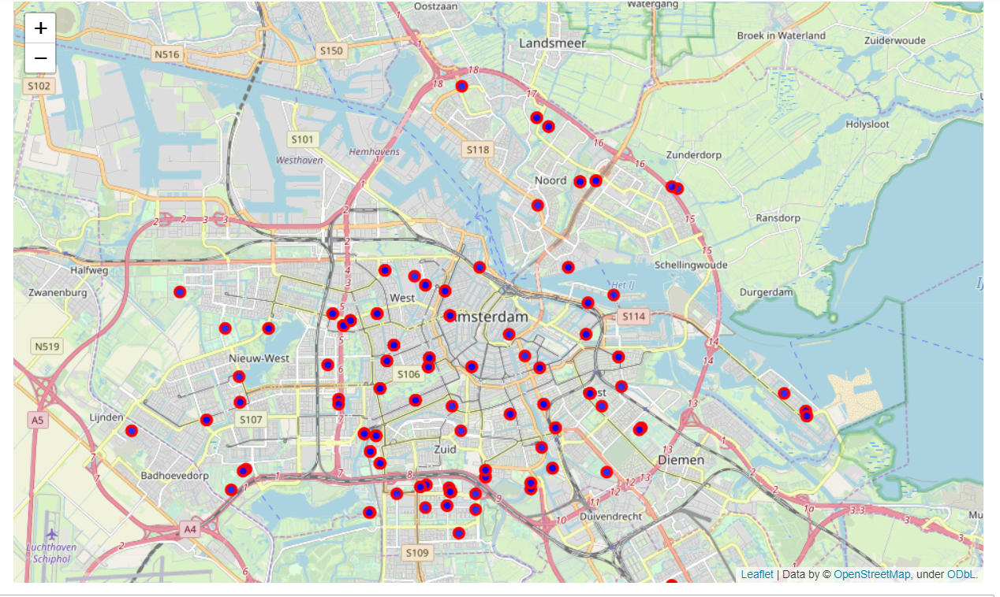

In [20]:
#lets clean up and merge the venue details into the district dataset 

ams_gyms_stats.rename(columns={'ID':'venue_id'}, inplace=True)  
ams_gyms_stats = ams_gyms_stats.drop_duplicates(subset='venue_id', keep="first")  
ams_gyms_stats['Likes'] = ams_gyms_stats['Likes'].astype(float) 
ams_gyms_stats['Rating'] = ams_gyms_stats['Rating'].astype(float) 



#merge datasets 

df_gyms = pd.merge(ams_gyms, ams_gyms_stats, on='venue_id', how='left')   
df_gyms.reset_index()
df_gyms.head(40)   



,District,Latitude,Longitude,Gym Population,venue_id,Venue,Venue Latitude,Venue Longitude,Venue Category,Likes,Rating,Tips
0,Grachtengordel-West,52.373709,4.886836,3055,4b155b3cf964a5207cab23e3,Health Club Jordaan,52.372969,4.880215,Gym / Fitness Center,59.0,8.7,8
1,Grachtengordel-Zuid,52.364821,4.893349,2775,4a6f294cf964a5207bd51fe3,Sportcity,52.362062,4.887875,Gym / Fitness Center,31.0,8.5,8
2,Nieuwmarkt/Lastage,52.372436,4.905641,4400,4a835233f964a520c6fa1fe3,SportCity,52.368877,4.900799,Gym,79.0,8.3,11
3,Haarlemmerbuurt,52.384171,4.890582,3975,4a6da31ff964a520d1d21fe3,Squash City,52.383135,4.890565,Gym / Fitness Center,92.0,8.6,15
4,Jordaan,52.374805,4.880786,9065,4b155b3cf964a5207cab23e3,Health Club Jordaan,52.372969,4.880215,Gym / Fitness Center,59.0,8.7,8
5,De Weteringschans,52.361170,4.892427,3965,4a6f294cf964a5207bd51fe3,Sportcity,52.362062,4.887875,Gym / Fitness Center,31.0,8.5,8
6,Weesperbuurt/Plantage,52.364499,4.911103,4020,570e06f6498ed51f6f8b4c29,HIGH STUDIOS,52.364273,4.906484,Gym / Fitness Center,16.0,8.3,2
7,Weesperbuurt/Plantage,52.364499,4.911103,4020,5b0987ca628c83002c42b7fc,Hyatt Regency Fitness Center and Spa,52.361710,4.911621,Gym / Fitness Center,9.0,8.0,1
8,Oostelijke Eilanden/Kadijken,52.370861,4.921954,5580,55a66681498ea7e1d87acdbb,Kensho Premium Fitness,52.368908,4.927632,Gym / Fitness Center,20.0,8.0,6
9,Oostelijke Eilanden/Kadijken,52.370861,4.921954,5580,57c9c816498e17c454f16d7b,New York Gym,52.375630,4.928310,Gym,22.0,7.9,3


In [21]:
#group all data by District to summarize and analyze the data   

#Define aggregations 
aggregations = {
    'Latitude':'min', 
    'Longitude': 'min', 
    'Gym Population': 'min', 
    'venue_id': 'count', 
    'Likes': 'mean', 
    'Rating': 'mean'
}
df_gyms = df_gyms.groupby('District').agg(aggregations)  
df_gyms.head() 

#add calculated column gyms per population 
df_gyms['Gyms per Person'] = df_gyms['venue_id']/df_gyms['Gym Population']
df_gyms.rename(columns={'venue_id':'Gyms'}, inplace=True)   

df_gyms.head()

,Latitude,Longitude,Gym Population,Gyms,Likes,Rating,Gyms per Person
District,,,,,,,
Amstel III/Bullewijk,52.296725,4.950137,370,2,22.0,7.500000,0.005405
Apollobuurt,52.348029,4.875915,3280,2,13.0,7.950000,0.000610
Banne Buiksloot,52.407294,4.917565,5630,3,12.0,6.300000,0.000533
Betondorp,52.341272,4.940232,1130,3,7.0,5.700000,0.002655
"Bijlmer Centrum (D,F,H)",52.315127,4.953987,12100,4,22.0,6.933333,0.000331


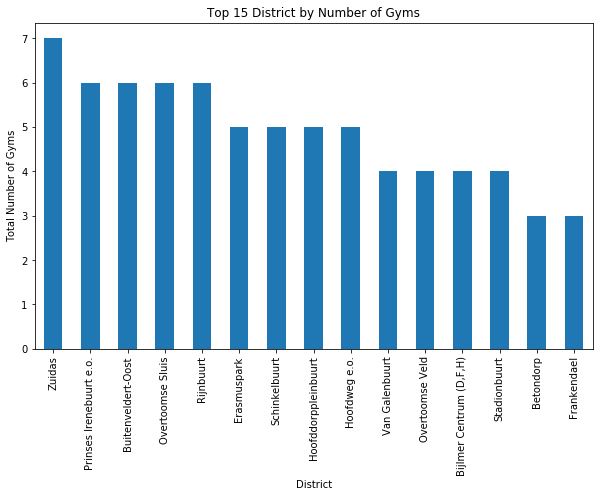

In [26]:
#Let's see the districts with most gyms 
df_gyms.sort_values(by='Gyms', ascending=False, inplace=True)
df_top15 = df_gyms['Gyms'].head(15)  
df_top15 

#visualize top 15 Districts 
df_top15.plot(kind='bar', figsize=(10, 6))

plt.xlabel('District') # add to x-label to the plot
plt.ylabel('Total Number of Gyms') # add y-label to the plot
plt.title('Top 15 District by Number of Gyms') # add title to the plot  


plt.show()

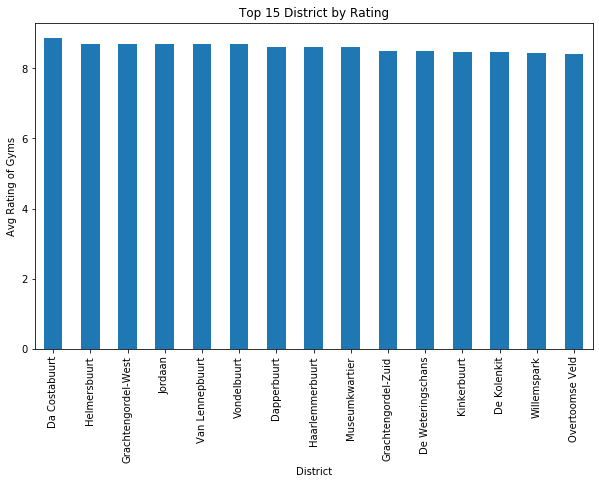

In [29]:
#Let's examine the avg ratings 
df_gyms.sort_values(by='Rating', ascending=False, inplace=True)
df_top15 = df_gyms['Rating'].head(15)  
df_top15 

#visualize top 15 Districts 
df_top15.plot(kind='bar', figsize=(10, 6))

plt.xlabel('District') # add to x-label to the plot
plt.ylabel('Avg Rating of Gyms') # add y-label to the plot
plt.title('Top 15 District by Rating') # add title to the plot  

plt.show()

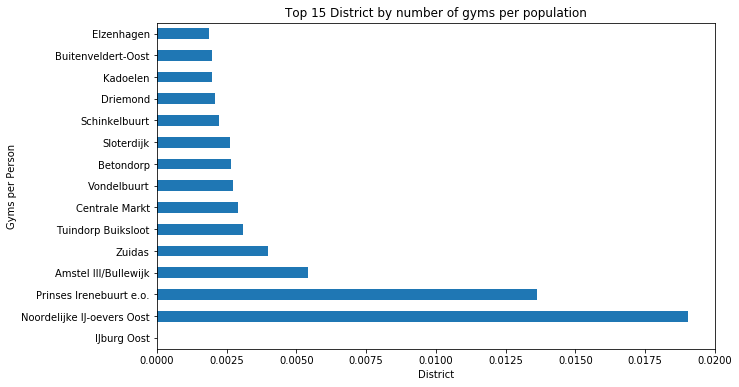

In [30]:
#Let's examine the # gyms per person
df_gyms.sort_values(by='Gyms per Person', ascending=False, inplace=True)
df_top15 = df_gyms['Gyms per Person'].head(15)  
df_top15 

#visualize top 15 Districts 
df_top15.plot(kind='barh', figsize=(10, 6))

plt.xlabel('District') # add to x-label to the plot
plt.ylabel('Gyms per Person') # add y-label to the plot
plt.title('Top 15 District by number of gyms per population') # add title to the plot  

plt.show()

###### - Let's analyze these districts on a choropleth map

In [31]:
#Download geojson (this data is retrieved from the city district dataset) 
geo3 = r'newtestgeo.json'

In [32]:
df_gyms.reset_index(level=['District'], inplace=True) 


geo_ams = folium.Map(location=[52.377956, 4.897070], zoom_start=12)

geo_ams.choropleth(
    geo_data=geo3,
    data=df_gyms,
    columns=['District', 'Gyms'],
    key_on='feature.properties.WK_NAAM',
    fill_color='Set1', 
    fill_opacity=0.8, 
    line_opacity=0.8,
    legend_name='Gyms in Amsterdam'
)

# display map
geo_ams


C:\Users\tiina\Anaconda3\lib\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


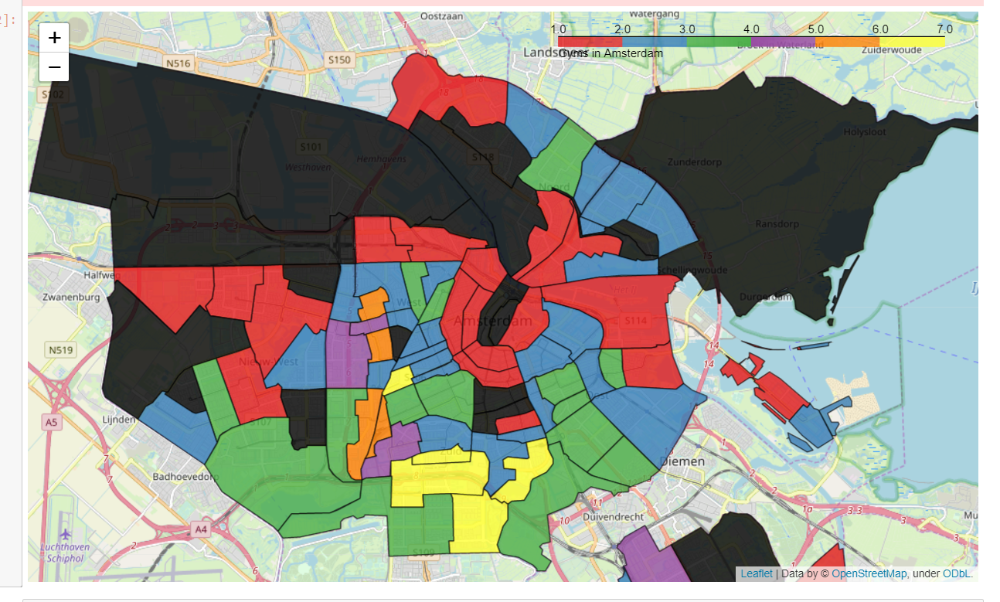

In [34]:
#lets also take a look at the individual locations 
map_ams2 = folium.Map(location=[52.377956, 4.897070], zoom_start=12)

# instantiate a feature group for the incidents in the dataframe
gyms = folium.map.FeatureGroup()

# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in zip(ams_gyms['Venue Latitude'], ams_gyms['Venue Longitude']):
    gyms.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=5, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='blue',
            fill_opacity=0.8
        )
    ) 
       
# add incidents to map
map_ams2.add_child(gyms) 
map_ams2

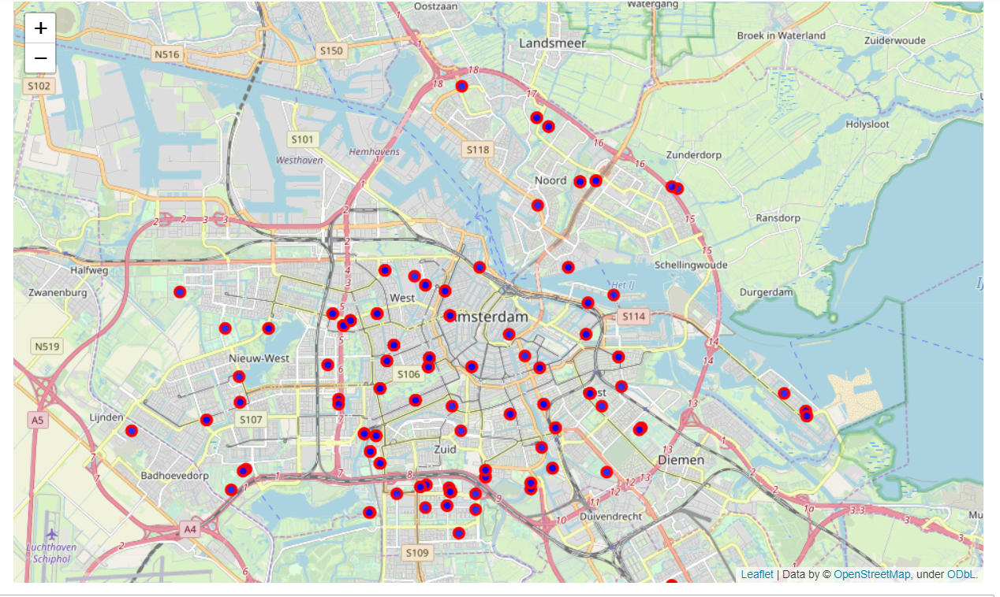

##### - Clustering of the districts 

###### - In order to find similarities across the different city districts we will be using k-means clusteing to analuze the neighborhoods

In [36]:
# set number of clusters
kclusters = 5

#drop District Column as k-means is not directly applicabl for categorical values    
df_gyms_clust = df_gyms.drop(['District', 'Latitude', 'Longitude'], axis=1) 


#Standardize the dataset 
from sklearn.preprocessing import StandardScaler

X = df_gyms_clust.values[:,1:]
X = np.nan_to_num(X)
cluster_dataset = StandardScaler().fit_transform(X)
cluster_dataset

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(cluster_dataset)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

C:\Users\tiina\Anaconda3\lib\site-packages\numpy\lib\nanfunctions.py:1508: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr)


array([3, 3, 1, 3, 1, 3, 3, 3, 3, 3])

In [37]:
# add clustering labels
df_gyms.insert(0, 'Cluster Labels', kmeans.labels_) 
df_gyms.set_index('District')
df_gyms.head()

,Cluster Labels,District,Latitude,Longitude,Gym Population,Gyms,Likes,Rating,Gyms per Person
0,3,IJburg Oost,52.352703,5.015088,0,2,18.500000,6.95,inf
1,3,Noordelijke IJ-oevers Oost,52.384304,4.934197,105,2,6.000000,7.80,0.019048
2,1,Prinses Irenebuurt e.o.,52.343151,4.875687,440,6,30.333333,8.00,0.013636
3,3,Amstel III/Bullewijk,52.296725,4.950137,370,2,22.000000,7.50,0.005405
4,1,Zuidas,52.338188,4.873875,1760,7,20.800000,7.28,0.003977


In [38]:
# create map
map_clusters = folium.Map(location=[52.377956, 4.897070], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(df_gyms['Latitude'], df_gyms['Longitude'], df_gyms['District'], df_gyms['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1).add_to(map_clusters) 
       
map_clusters

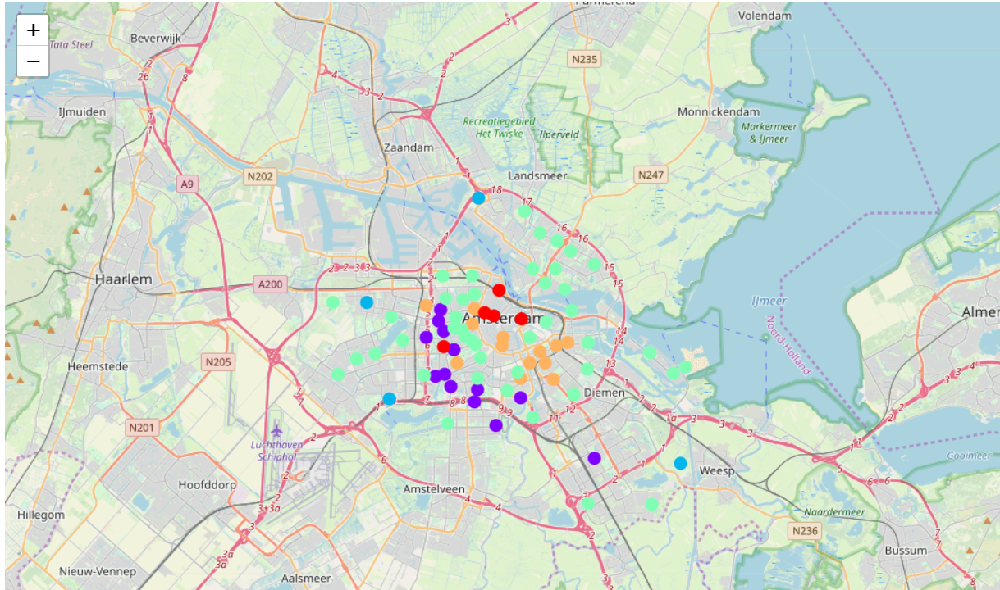

In [40]:
#add geojson layer for easier recognition 

map_clusters.choropleth(
    geo_data=geo3,
    data=df_gyms,
    columns=['District', 'Cluster Labels'],
    key_on='feature.properties.WK_NAAM',
    fill_color='Set1', 
    fill_opacity=0.8, 
    line_opacity=0.8,
    legend_name='City Clusters'
) 

map_clusters

C:\Users\tiina\Anaconda3\lib\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


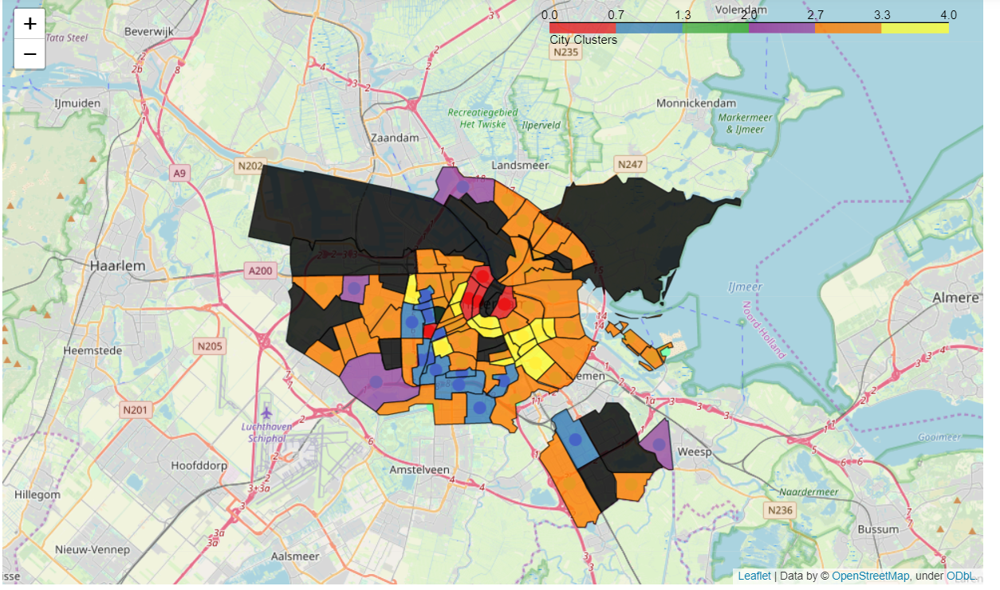

In [41]:
#find the cluster averages 
# Labels means 
df_gyms.groupby('Cluster Labels').mean() 

,Latitude,Longitude,Gym Population,Gyms,Likes,Rating,Gyms per Person
Cluster Labels,,,,,,,
0,52.373232,4.883445,4936.000000,1.200000,70.000000,8.440000,0.000279
1,52.349744,4.870130,4753.846154,5.153846,22.521795,7.858205,0.002306
2,52.363384,4.876932,4083.750000,1.500000,NaN,NaN,0.000774
3,52.366110,4.895470,4104.090909,1.909091,13.306818,7.482955,inf
4,52.360860,4.898555,4275.769231,2.307692,37.076923,8.301282,0.000583


###### - Let's now analyze the individual clusters

In [42]:
#Cluster 0 - Districts in Cluster 0
df_gyms.loc[df_gyms['Cluster Labels'] == 0, df_gyms.columns[[1] + list(range(4, df_gyms.shape[1]))]]

,District,Gym Population,Gyms,Likes,Rating,Gyms per Person
46,Westindische Buurt,4185,2,61.0,7.9,0.000478
58,Grachtengordel-West,3055,1,59.0,8.7,0.000327
66,Haarlemmerbuurt,3975,1,92.0,8.6,0.000252
68,Nieuwmarkt/Lastage,4400,1,79.0,8.3,0.000227
78,Jordaan,9065,1,59.0,8.7,0.000110


In [43]:
#cluster 1 
df_gyms.loc[df_gyms['Cluster Labels'] == 1, df_gyms.columns[[1] + list(range(4, df_gyms.shape[1]))]]

,District,Gym Population,Gyms,Likes,Rating,Gyms per Person
2,Prinses Irenebuurt e.o.,440,6,30.333333,8.000000,0.013636
4,Zuidas,1760,7,20.800000,7.280000,0.003977
10,Schinkelbuurt,2240,5,38.800000,8.240000,0.002232
13,Buitenveldert-Oost,3035,6,9.333333,7.233333,0.001977
15,Erasmuspark,3630,5,19.750000,8.075000,0.001377
16,Overtoomse Sluis,4515,6,29.500000,8.250000,0.001329
18,Rijnbuurt,4825,6,13.000000,7.160000,0.001244
20,Van Galenbuurt,3990,4,19.250000,8.125000,0.001003
22,Hoofdweg e.o.,5875,5,19.200000,8.060000,0.000851
24,Hoofddorppleinbuurt,6730,5,21.400000,8.100000,0.000743


In [44]:
#cluster 2
df_gyms.loc[df_gyms['Cluster Labels'] == 2, df_gyms.columns[[1] + list(range(4, df_gyms.shape[1]))]]

,District,Gym Population,Gyms,Likes,Rating,Gyms per Person
11,Driemond,480,1,NaN,NaN,0.002083
37,Sloter-/Riekerpolder,5230,3,NaN,NaN,0.000574
59,Oostzanerwerf,3300,1,NaN,NaN,0.000303
75,Geuzenveld,7325,1,NaN,NaN,0.000137


In [45]:
#cluster 3 
df_gyms.loc[df_gyms['Cluster Labels'] == 3, df_gyms.columns[[1] + list(range(4, df_gyms.shape[1]))]]

,District,Gym Population,Gyms,Likes,Rating,Gyms per Person
0,IJburg Oost,0,2,18.500000,6.950000,inf
1,Noordelijke IJ-oevers Oost,105,2,6.000000,7.800000,0.019048
3,Amstel III/Bullewijk,370,2,22.000000,7.500000,0.005405
5,Tuindorp Buiksloot,650,2,12.000000,7.500000,0.003077
6,Centrale Markt,1035,3,18.000000,8.066667,0.002899
7,Vondelbuurt,735,2,18.500000,8.700000,0.002721
8,Betondorp,1130,3,7.000000,5.700000,0.002655
9,Sloterdijk,380,1,11.000000,7.700000,0.002632
12,Kadoelen,1010,2,12.000000,6.300000,0.001980
14,Elzenhagen,1065,2,12.000000,7.500000,0.001878


In [46]:
#cluster 4
df_gyms.loc[df_gyms['Cluster Labels'] == 4, df_gyms.columns[[1] + list(range(4, df_gyms.shape[1]))]]

,District,Gym Population,Gyms,Likes,Rating,Gyms per Person
17,Willemspark,2340,3,46.333333,8.433333,0.001282
23,Da Costabuurt,2580,2,37.000000,8.850000,0.000775
26,IJselbuurt,2885,2,46.500000,7.600000,0.000693
28,Weesperzijde,2980,2,42.500000,7.850000,0.000671
29,Frederik Hendrikbuurt,4595,3,34.000000,8.400000,0.000653
33,Transvaalbuurt,5020,3,46.666667,8.233333,0.000598
40,Frankendael,5545,3,47.000000,7.800000,0.000541
43,Oosterparkbuurt,5755,3,26.666667,8.300000,0.000521
49,Dapperbuurt,4565,2,34.000000,8.600000,0.000438
50,Indische Buurt West,7175,3,29.333333,8.400000,0.000418


In [47]:
#rename cluster values to more describing values 
df_gyms['Cluster Labels'].replace(0, "High Pop/High Rating/Low Gyms pp",inplace=True)  
df_gyms['Cluster Labels'].replace(1, "High Pop/Med Rating/High Gyms pp",inplace=True)   
df_gyms['Cluster Labels'].replace(2, "Med Pop/No Ratings/Med Gyms pp",inplace=True)   
df_gyms['Cluster Labels'].replace(3, "Med Pop/Low Rating/Med Gyms pp",inplace=True)   
df_gyms['Cluster Labels'].replace(4, "Med Pop/High Rating/Low Gym pp",inplace=True)   


In [48]:
df_gyms.head()

,Cluster Labels,District,Latitude,Longitude,Gym Population,Gyms,Likes,Rating,Gyms per Person
0,Med Pop/Low Rating/Med Gyms pp,IJburg Oost,52.352703,5.015088,0,2,18.500000,6.95,inf
1,Med Pop/Low Rating/Med Gyms pp,Noordelijke IJ-oevers Oost,52.384304,4.934197,105,2,6.000000,7.80,0.019048
2,High Pop/Med Rating/High Gyms pp,Prinses Irenebuurt e.o.,52.343151,4.875687,440,6,30.333333,8.00,0.013636
3,Med Pop/Low Rating/Med Gyms pp,Amstel III/Bullewijk,52.296725,4.950137,370,2,22.000000,7.50,0.005405
4,High Pop/Med Rating/High Gyms pp,Zuidas,52.338188,4.873875,1760,7,20.800000,7.28,0.003977


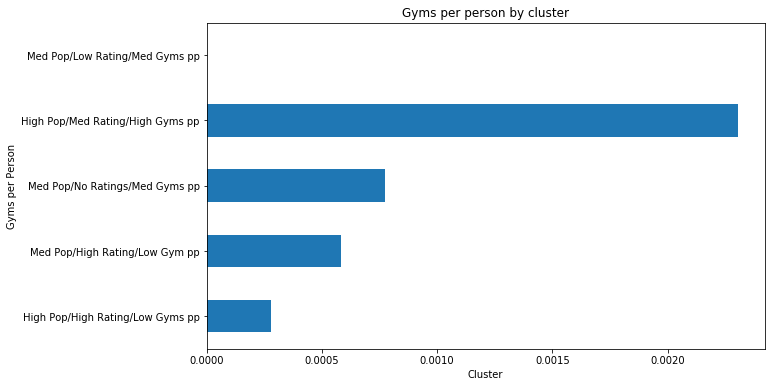

In [49]:
#final visualizations 
df_gyms_grouped = df_gyms.groupby('Cluster Labels').mean()   
df_gyms_grouped.sort_values(by='Gyms per Person', ascending=True, inplace=True)
df_gpp = df_gyms_grouped['Gyms per Person']  

#visualize top 15 Districts 
df_gpp.plot(kind='barh', figsize=(10, 6))

plt.xlabel('Cluster') # add to x-label to the plot
plt.ylabel('Gyms per Person') # add y-label to the plot
plt.title('Gyms per person by cluster') # add title to the plot  

plt.show()

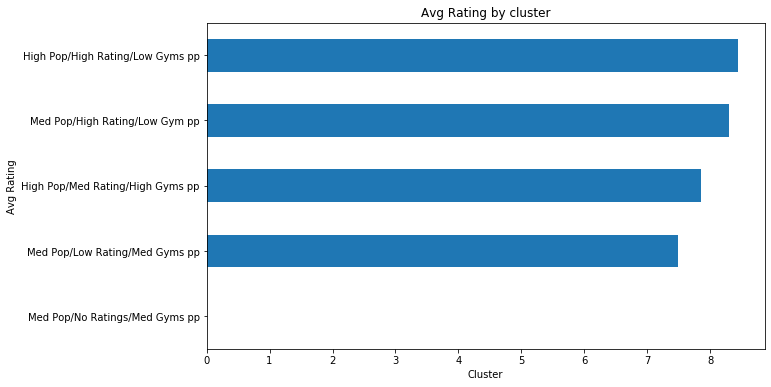

In [50]:
#rating
df_gyms_grouped.sort_values(by='Rating', ascending=True, inplace=True, na_position='first')
df_gpp = df_gyms_grouped['Rating']  

#visualize top 15 Districts 
df_gpp.plot(kind='barh', figsize=(10, 6))

plt.xlabel('Cluster') # add to x-label to the plot
plt.ylabel('Avg Rating') # add y-label to the plot
plt.title('Avg Rating by cluster') # add title to the plot  

plt.show()

In [51]:
#visualize the recommended districts 

#define recommended clusters
rec_clusters = ["High Pop/High Rating/Low Gyms pp", "Med Pop/High Rating/Low Gym pp"]
df_recommendation = df_gyms[df_gyms['Cluster Labels'].isin(rec_clusters)] 
print("Recommended Districts for new gyms are: ",  
      df_recommendation['District'])

Recommended Districts for new gyms are:  17              Willemspark
23            Da Costabuurt
26               IJselbuurt
28             Weesperzijde
29    Frederik Hendrikbuurt
33           Transvaalbuurt
40              Frankendael
43          Oosterparkbuurt
46       Westindische Buurt
49              Dapperbuurt
50      Indische Buurt West
52              De Kolenkit
54      Grachtengordel-Zuid
58      Grachtengordel-West
65        De Weteringschans
66          Haarlemmerbuurt
68       Nieuwmarkt/Lastage
78                  Jordaan
Name: District, dtype: object


In [54]:
#recommended neighborhoods on a map  
map_rec = folium.Map(location=[52.377956, 4.897070], zoom_start=11)

map_rec.choropleth(
    geo_data=geo3,
    data=df_recommendation,
    columns=['District', 'Gyms per Person'],
    key_on='feature.properties.WK_NAAM',
    fill_color='Set1', 
    fill_opacity=0.8, 
    line_opacity=0.8,
    legend_name='Recommended Districts for New Gym Locations by Existing Gyms per Person'
) 

map_rec

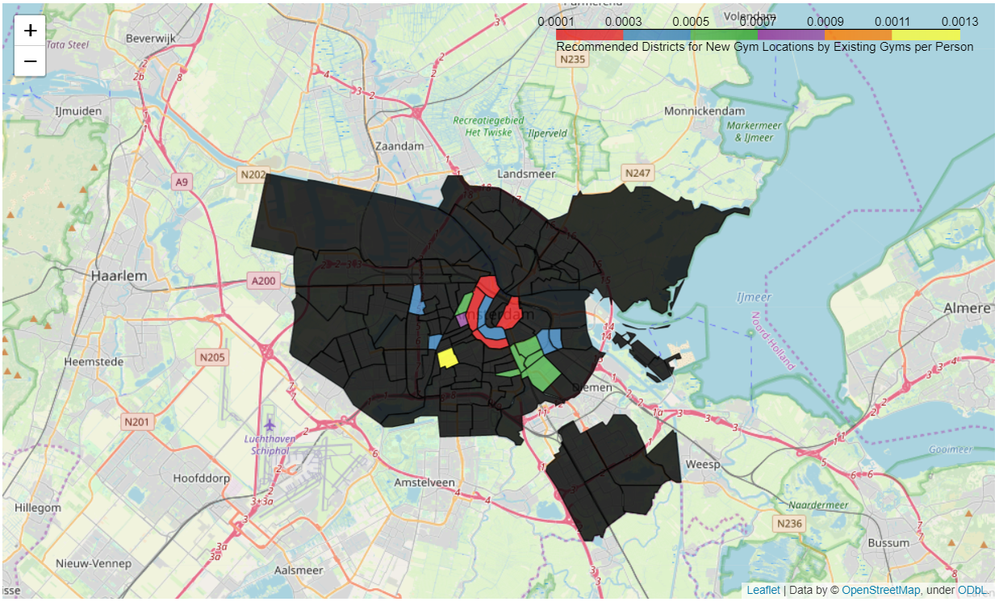

## Conclusions 

##### - This project has carried out analysis on gyms, ratings, likes and locations on Amsterdam. The following conclusions summarize the results and recommendations:  
- There are still unsaturated potential new locations for gyms and fitness center in Amsterdam Area   
- The districts can be clustered into 5 categories: (High Pop= High Population, Gyms pp = Gyms per person in the district)
    - High Pop/High Rating/Low Gyms pp
    - High Pop/Med Rating/High Gyms pp 
    - Med Pop/No Ratings/Med Gyms pp   
    - Med Pop/Low Rating/Med Gyms pp   
    - Med Pop/High Rating/Low Gym pp
- On one hand, the areas with low rating and low gyms per person can be a potential for a new player to step in with a superior gym. While on the other hand, the areas with high ratings have higher competition, it may mean that the gym goers can be easier to satisfy in these districts.  
- Districts with "High Gyms pp" are already saturated and there may not be room for a new competitor or location
- For further analysis it would be great to combinine this information with some democraphig data (eg. education, income level), as these analysis could serve as a great starting point for further analysis on these neighborhoods as potential gym locations.  

###### - Limitations 
- These analysis are limited by the nature of data used in the analysis 
- The accuracy of the gym details is depended on the data available from the Foursquare API  
- The carrier of this projet is a beginner in Python and the analysis are still limited to superficial level



## Sources 

####### - "Trends in the Netherlands", Figures Leisure, https://longreads.cbs.nl/trends18-eng/society/figures/leisure/ 
####### - "Leading Fitness Centers in the Netherlands, by number of clubs (2018) https://www.statista.com/statistics/819238/leading-fitness-centers-in-the-netherlands-by-number-of-clubs/